# Object Detection with PyTorch: Single-Stage Object Detector 

[Pablo Carballeira] (http://dymas.ii.uam.es/webvpu/gti/user/186/), Escuela Politecnica Superior, Universidad Autónoma de Madrid.

Parts of this code have been adapted from the work of Justin Johnson (https://web.eecs.umich.edu/~justincj/), Electrical Engineering and Computer Science (EECS), University of Michigan.

You can find documentation about working in Colab here (https://colab.research.google.com/notebooks/intro.ipynb)

---

In this lab session you will implement a **single-stage** object detector, based on YOLO ([v1](https://arxiv.org/pdf/1506.02640.pdf) and [v2](https://arxiv.org/pdf/1612.08242.pdf)) and use it to train a model that can detect objects on novel images. We will also evaluate the detection accuracy using the classic metric mean Average Precision ([mAP](https://github.com/Cartucho/mAP)).

For this assignment, you will download the VOC dataset to your Google Drive. You will need around 1GB of free space in your Google account to complete the assignment.





# Instructions

Anywhere you see a **???** in the code below, fill in in with the correct code.

# Getting Started

## Setup Code
Before getting started, we need to run some boilerplate code to set up our environment. You'll need to rerun this setup code each time you start the notebook.

First, run this cell load the autoreload extension. This allows us to edit .py source files, and re-import them into the notebook for a seamless editing and debugging experience.

In [43]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Google Colab Setup
Next we need to run a few commands to set up our environment on Google Colab.Run the following cell to mount your Google Drive. Follow the link, sign in to your Google account (the same account you used to store this notebook!) and copy the authorization code into the text box that appears below.

In [49]:
"""from google.colab import drive
drive.mount('/content/drive')"""

"from google.colab import drive\ndrive.mount('/content/drive')"

Now recall the path in your Google Drive where you uploaded this notebook, fill it in below. If everything is working correctly then running the folowing cell should print the filenames from the assignment:

```
['single_stage_detector_yolo.ipynb', 'eecs598', 'single_stage_detector.py', 'a5_helper.py']
```

In [50]:
"""

import os

# TODO: Fill in the Google Drive path where you uploaded the assignment
# Example: If you create a DL4ISP folder and put all the files under P4 folder, then 'DL4ISP/P4'
GOOGLE_DRIVE_PATH_AFTER_MYDRIVE = ??? 

GOOGLE_DRIVE_PATH = os.path.join('drive', 'My Drive', GOOGLE_DRIVE_PATH_AFTER_MYDRIVE)
print(os.listdir(GOOGLE_DRIVE_PATH))

"""

"\n\nimport os\n\n# TODO: Fill in the Google Drive path where you uploaded the assignment\n# Example: If you create a DL4ISP folder and put all the files under P4 folder, then 'DL4ISP/P4'\nGOOGLE_DRIVE_PATH_AFTER_MYDRIVE = ??? \n\nGOOGLE_DRIVE_PATH = os.path.join('drive', 'My Drive', GOOGLE_DRIVE_PATH_AFTER_MYDRIVE)\nprint(os.listdir(GOOGLE_DRIVE_PATH))\n\n"

Once you have successfully mounted your Google Drive and located the path to this assignment, run thw following cell to allow us to import from the `.py` files of this assignment. If it works correctly, it should print the message:

```
Hello from single_stage_detector.py!
Hello from a5_helper.py!
```

as well as the last edit time for the file `single_stage_detector.py`.

## Imports 
Load several useful packages that are used in this notebook:

In [2]:
GOOGLE_DRIVE_PATH = '.'

import sys
sys.path.append(GOOGLE_DRIVE_PATH)

import time, os
os.environ["TZ"] = "Europe"
time.tzset()

from single_stage_detector import hello_single_stage_detector
hello_single_stage_detector()

from a5_helper import hello_helper
hello_helper()

single_stage_detector_path = os.path.join(GOOGLE_DRIVE_PATH, 'single_stage_detector.py')
single_stage_detector_edit_time = time.ctime(os.path.getmtime(single_stage_detector_path))
print('single_stage_detector.py last edited on %s' % single_stage_detector_edit_time)

Hello from single_stage_detector.py!
Hello from a5_helper.py!
single_stage_detector.py last edited on Wed Dec  6 16:39:38 2023


In [4]:
import eecs598
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import statistics
import random
import time
import math
import numpy as np
import cv2
import copy
import shutil
import os
import json

import matplotlib.pyplot as plt
%matplotlib inline

from eecs598 import reset_seed, Solver
from eecs598.grad import rel_error

from a5_helper import *

# for plotting
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['font.size'] = 16
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# for mAP evaluation
!rm -rf mAP
!git clone https://github.com/Cartucho/mAP.git
!rm -rf mAP/input/*

from eecs598.vis import detection_visualizer
from a5_helper import coord_trans

# Import Pascal clas mappings
from a5_helper import class_to_idx, idx_to_class

Cloning into 'mAP'...
remote: Enumerating objects: 908, done.
remote: Counting objects: 100% (150/150), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 908 (delta 135), reused 125 (delta 125), pack-reused 758
Receiving objects: 100% (908/908), 14.70 MiB | 14.73 MiB/s, done.
Resolving deltas: 100% (329/329), done.


We will use GPUs to accelerate our computation in this notebook. Run the following to make sure GPUs are enabled:

In [5]:
if torch.cuda.is_available:
  print('Good to go!')
else:
  print('Please set GPU via Edit -> Notebook Settings.')

Good to go!


## Load PASCAL VOC 2007 data

We will need to use a new dataset for object detection. In order to train and evaluate object detection models, we need a dataset where each image is annotated with a *set* of *bounding boxes*, where each box gives the category label and spatial extent of some object in the image.

We will use the [PASCAL VOC 2007](http://host.robots.ox.ac.uk/pascal/VOC/) dataset, which provides annotations of this form. PASCAL VOC ran a series of yearly computer vision competitions from 2005 to 2012. The data from the 2007 challenge used to be one of the most popular datasets for evaluating object detection. It is much smaller than more recent object detection datasets such as [COCO](http://cocodataset.org/#home), and thus easier to manage in a lab assignment.

The function `get_pascal_voc2007_data` in `a5_helper.py` will download the PASCAL VOC 2007 dataset and return it as a PyTorch Dataset object. Run the following cell to download the training and validation sets for the PASCAL VOC 2007 dataset.

The [`Dataset`](https://pytorch.org/docs/stable/data.html#torch.utils.data.Dataset) objects returned from the above function returns annotations for each image as a nested set of dictionary objects. The following code will print an example of the structure of the annotations.

In [6]:
# uncomment below to use the mirror link if the original link is broken and move it to GOOGLE_DRIVE_PATH
# !wget https://web.eecs.umich.edu/~justincj/data/VOCtrainval_06-Nov-2007.tar
# shutil.move('VOCtrainval_06-Nov-2007.tar', os.path.join(GOOGLE_DRIVE_PATH, 'VOCtrainval_06-Nov-2007.tar'))  
train_dataset = get_pascal_voc2007_data(GOOGLE_DRIVE_PATH, 'train')
val_dataset = get_pascal_voc2007_data(GOOGLE_DRIVE_PATH, 'val')

# an example on the raw annotation
print(json.dumps(train_dataset[1][1]['annotation'], indent=2))

{
  "folder": "VOC2007",
  "filename": "000017.jpg",
  "source": {
    "database": "The VOC2007 Database",
    "annotation": "PASCAL VOC2007",
    "image": "flickr",
    "flickrid": "228217974"
  },
  "owner": {
    "flickrid": "genewolf",
    "name": "whiskey kitten"
  },
  "size": {
    "width": "480",
    "height": "364",
    "depth": "3"
  },
  "segmented": "0",
  "object": [
    {
      "name": "person",
      "pose": "Left",
      "truncated": "0",
      "difficult": "0",
      "bndbox": {
        "xmin": "185",
        "ymin": "62",
        "xmax": "279",
        "ymax": "199"
      }
    },
    {
      "name": "horse",
      "pose": "Left",
      "truncated": "0",
      "difficult": "0",
      "bndbox": {
        "xmin": "90",
        "ymin": "78",
        "xmax": "403",
        "ymax": "336"
      }
    }
  ]
}


In order to use these annotations to train our model, we need to convert this nested dictionary data structure into a set of PyTorch tensors.

We also need to preprocess the image, converting it to a PyTorch tensor and resizing it to 224x224. Real object detection systems typically work with much higher-resolution images, but we will use a low resolution for computational efficiency in this assignment.

We also want to train our models using minibatches of data, so we need to group the annotations from several images into minibatches.

We perform both of these functions by using a customized PyTorch [DataLoader](https://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader) object, which we have written for you. Those functions are all available in `a5_helper.py`. 

Training with the entire PASCAL VOC will be too computationally expensive for this homework assignment, so we can subsample the dataset by wrapping each `Dataset` object in a [`Subset`](https://pytorch.org/docs/stable/data.html#torch.utils.data.Subset) object:

In [7]:
train_dataset = torch.utils.data.Subset(train_dataset, torch.arange(0, 2500)) # use 2500 samples for training
train_loader = pascal_voc2007_loader(train_dataset, 10)
val_loader = pascal_voc2007_loader(val_dataset, 10)

The `DataLoader` objects return batches of data.

The first output from the `DataLoader` is a Tensor `img` of shape `(B, 3, 224, 224)`. This is a batch of `B` images, similar to what we have seen in classification datasets.

The second output from the `DataLoader` is a Tensor `ann` of shape `(B, N, 5)` giving information about all objects in all images of the batch. `ann[i, j] = (x_tl, y_tl, x_br, y_br, class)` gives information about the `j`th object in `img[i]`. The position of the top-left corner of the box is `(x_tl, y_tl)` and the position of the bottom-right corner of the box is `(x_br, y_br)`. These positions are in the coordinate system of the original image (before it was resized to 224 x 224). `class` is an integer giving the category label for this bounding box.

Each image can have different numbers of objects. If `img[i]` has $N_i$ objects, then $N=\max_i N_i$ is the maximum number of objects per image among all objects in the batch; this value can vary from batch to batch. For the images that have fewer than $N$ annotated objects, only the first $N_i$ rows of $anns[i]$ contain annotations; the remaining rows are padded with -1.

In [8]:
train_loader_iter = iter(train_loader)
# img, ann, _, _, _ = train_loader_iter.next()
img, ann, _, _, _ = next(train_loader_iter)

print('img has shape: ', img.shape)
print('ann has shape: ', ann.shape)

print('Image 1 has only two annotated objects, so ann[1] is padded with -1:')
print(ann[1])

print('\nImage 2 has six annotated objects:, so ann[2] is not padded:')
print(ann[2])

print('\nEach row in the annotation tensor indicates (x_tl, y_tl, x_br, y_br, class).')

img has shape:  torch.Size([10, 3, 224, 224])
ann has shape:  torch.Size([10, 6, 5])
Image 1 has only two annotated objects, so ann[1] is padded with -1:
tensor([[185.,  62., 279., 199.,  14.],
        [ 90.,  78., 403., 336.,  12.],
        [ -1.,  -1.,  -1.,  -1.,  -1.],
        [ -1.,  -1.,  -1.,  -1.,  -1.],
        [ -1.,  -1.,  -1.,  -1.,  -1.],
        [ -1.,  -1.,  -1.,  -1.,  -1.]])

Image 2 has six annotated objects:, so ann[2] is not padded:
tensor([[  9., 230., 245., 500.,   1.],
        [230., 220., 334., 500.,   1.],
        [  2., 178.,  90., 500.,   1.],
        [  2.,   1., 117., 369.,  14.],
        [  3.,   2., 243., 462.,  14.],
        [225.,   1., 334., 486.,  14.]])

Each row in the annotation tensor indicates (x_tl, y_tl, x_br, y_br, class).


## Visualize PASCAL VOC 2007
It is always good practice to try and visualize parts of your dataset before you build a model.

Here we sample some  images from the PASCAL VOC 2007 training set, and visualize the ground-truth object boxes and category labels:

In [9]:
# default examples for visualization
reset_seed(0)
batch_size = 3
sampled_idx = torch.linspace(0, len(train_dataset)-1, steps=batch_size).long()

# get the size of each image first
h_list = []
w_list = []
img_list = [] # list of images
MAX_NUM_BBOX = 40
box_list = torch.LongTensor(batch_size, MAX_NUM_BBOX, 5).fill_(-1) # PADDED GT boxes

for idx, i in enumerate(sampled_idx):
  # hack to get the original image so we don't have to load from local again...
  img, ann = train_dataset.__getitem__(i)
  img_list.append(img)

  all_bbox = ann['annotation']['object']
  if type(all_bbox) == dict:
    all_bbox = [all_bbox]
  for bbox_idx, one_bbox in enumerate(all_bbox):
    bbox = one_bbox['bndbox']
    obj_cls = one_bbox['name']
    box_list[idx][bbox_idx] = torch.LongTensor([int(bbox['xmin']), int(bbox['ymin']),
      int(bbox['xmax']), int(bbox['ymax']), class_to_idx[obj_cls]])

  # get sizes
  img = np.array(img)
  w_list.append(img.shape[1])
  h_list.append(img.shape[0])

w_list = torch.as_tensor(w_list).float().cuda()
h_list = torch.as_tensor(h_list).float().cuda()
box_list = torch.as_tensor(box_list).float().cuda()
resized_box_list = coord_trans(box_list, w_list, h_list, mode='p2a') # on activation map coordinate system

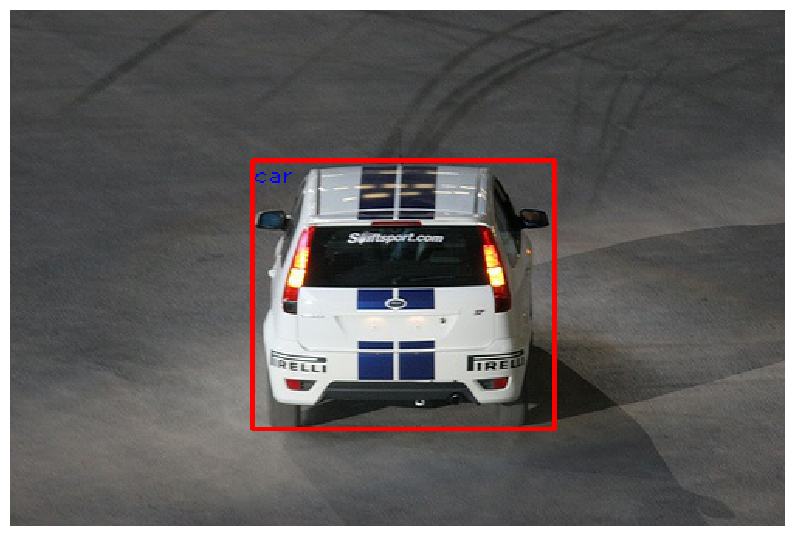

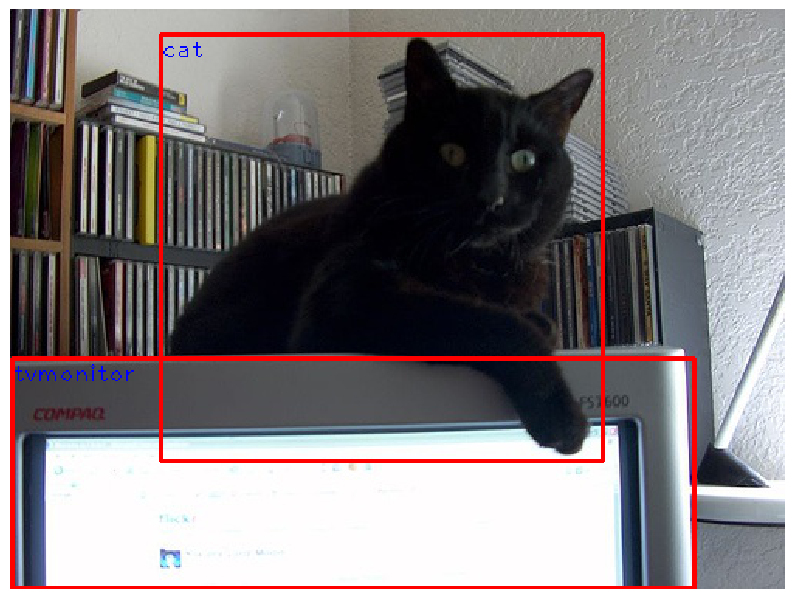

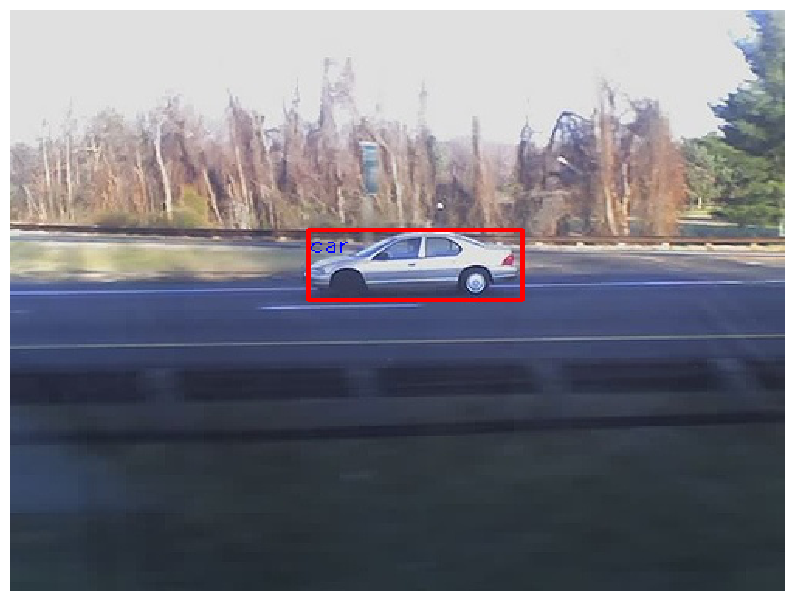

In [10]:
# visualize GT boxes
for i in range(len(img_list)):
  valid_box = sum([1 if j != -1 else 0 for j in box_list[i][:, 0]])
  detection_visualizer(img_list[i], idx_to_class, box_list[i][:valid_box])

# Coordinate transformation
It's a good practice to use a consistent coordinate system for all the spatial-related computations (e.g., anchors, proposals). **In this assignment, we use the coordinate system defined by the CNN activation map (of shape 7x7), where the top-left corner is (0, 0) and the bottom-right corner is (7, 7). The horizontal axis is the x axis and the vertical axis is the y axis.**

```

Note: All the coordinates are in float precision. In later sections, we use the activation map coordinate system for all computations except for visualization.

# Detector Backbone Network
Here, we use [MobileNet v2](https://pytorch.org/hub/pytorch_vision_mobilenet_v2/) for image feature extraction.  The function is included in a5_helper


Now, let's see what's inside MobileNet v2. Assume we have a 3x224x224 image input.

In [11]:
model = FeatureExtractor(verbose=True)

/home/javiermunoz/miniconda3/envs/pytorch-env/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/javiermunoz/miniconda3/envs/pytorch-env/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Layer (type:depth-idx)                             Output Shape              Param #
├─Sequential: 1-1                                  [-1, 1280, 7, 7]          --
|    └─Conv2dNormActivation: 2-1                   [-1, 32, 112, 112]        --
|    |    └─Conv2d: 3-1                            [-1, 32, 112, 112]        864
|    |    └─BatchNorm2d: 3-2                       [-1, 32, 112, 112]        64
|    |    └─ReLU6: 3-3                             [-1, 32, 112, 112]        --
|    └─InvertedResidual: 2-2                       [-1, 16, 112, 112]        --
|    |    └─Sequential: 3-4                        [-1, 16, 112, 112]        896
|    └─InvertedResidual: 2-3                       [-1, 24, 56, 56]          --
|    |    └─Sequential: 3-5                        [-1, 24, 56, 56]          5,136
|    └─InvertedResidual: 2-4                       [-1, 24, 56, 56]          --
|    |    └─Sequential: 3-6                        [-1, 24, 56, 56]          8,832
|    └─InvertedResidual: 2-

# Anchors and Proposals
The concept of *anchor* is introduced in [Faster R-CNN](https://arxiv.org/pdf/1506.01497.pdf) and later used in numerous later works including [YOLO v2](https://arxiv.org/pdf/1612.08242.pdf). The definition of anchor from the original paper is summarized as follows:

After passing the input image through the backbone network, we have a convolutional feature map of shape $(C, 7, 7)$ which we interpret as a 7x7 grid of $C$-dimensional features. At each point in this grid, we consider a set of $A$ *anchor boxes* of different sizes and shapes; for each anchor box we classify it as either an object or background box. The total number of anchor boxes that we consider for the entire input image is $A \times 7 \times 7$. 

We predict classification scores of this shape by applying a sequence of convolutional layers to the backbone features. We slide a small network (e.g., 3x3 conv layer) over the CNN activation feature map. We call this 3x3 conv a sliding window. At each sliding-window location (i.e., centered at each position of the 7x7 activation cell), we simultaneously predict multiple region *proposals*, where the number of proposals for each location is denoted as $A=9$.

Later, we will have an object proposal layer outputs
A scores that estimate the objectness probability of for each proposal, a bounding box regression layer to produce 4A outputs encoding
the coordinates of A boxes, and a region classification layer to produce 20 outputs (VOC classes) indicating the probability of being each object category (shared by all A anchors). The A *proposals* are parameterized relative to A reference boxes, which we call *anchors*. An anchor is centered at the sliding window in question, and is associated with a shape (e.g., 1x1, 3x3, 5x5). 





## Anchor shapes
At each spatial position of the 7x7 backbone features, we consider a set of $A$ anchor boxes. Different spatial positions on the feature map use anchors of the same shape. Note that anchors could be much larger than the 3x3 sliding window (e.g., 5x5) since the receptive field of activation cell on the original image could be large

The shapes of the anchor boxes are a hyperparameter. We will provide the anchor shapes for you. In some papers (e.g. YOLO v2), the anchor shapes are determined in a data-driven way by clustering the set of ground-truth box sizes, but for simplicity we will not use that approach in this assignment.

.

In [12]:
# Declare variables for anchor priors, a Ax2 Tensor where A is the number of anchors. Hand-picked.
anchor_list = torch.tensor([[1, 1], [2, 2], [3, 3], [4, 4], [5, 5], [2, 3], [3, 2], [3, 5], [5, 3]]).float().cuda()
print(anchor_list.shape)

torch.Size([9, 2])


## Activation Grid Generator
In order to place anchors centered at each position of the 7x7 grid of backbone features, we need to know the spatial position of the center of each cell in the 7x7 grid of features.

GenerateGrid will compute these center coordinates for us. We now visualize its output.

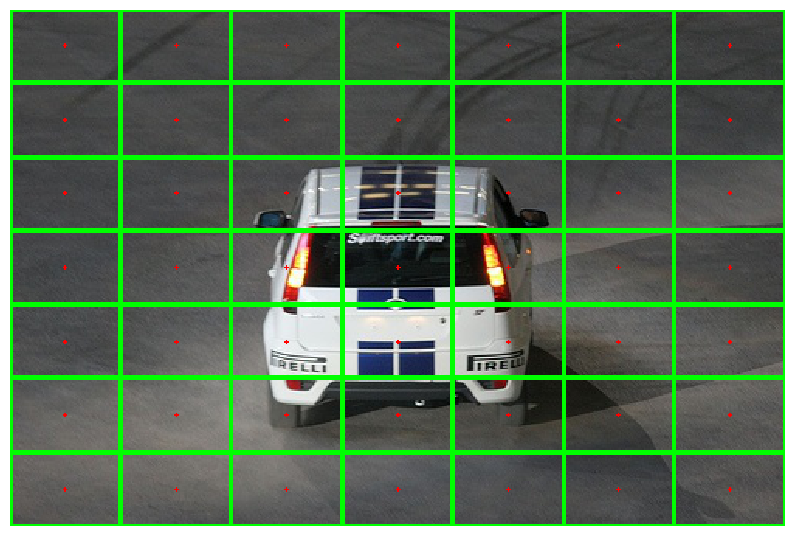

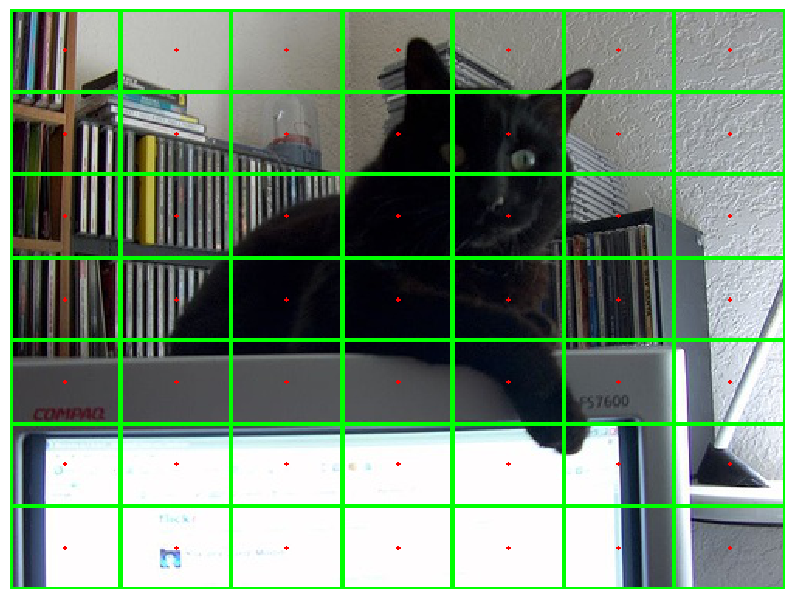

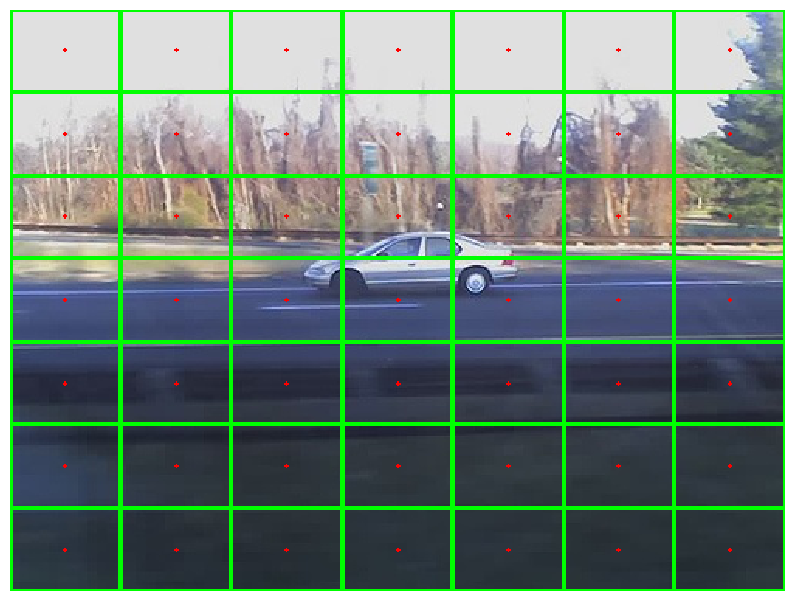

In [13]:
# visualization
# simply create an activation grid where the cells are in green and the centers in red
# you should see the entire image divided by a 7x7 grid, with no gaps on the edges

grid_list = GenerateGrid(w_list.shape[0])

center = torch.cat((grid_list, grid_list), dim=-1)
grid_cell = center.clone()
grid_cell[:, :, :, [0, 1]] -= 1. / 2.
grid_cell[:, :, :, [2, 3]] += 1. / 2.
center = coord_trans(center, w_list, h_list)
grid_cell = coord_trans(grid_cell, w_list, h_list)

for img, anc, grid in zip(img_list, center, grid_cell):
  detection_visualizer(img, idx_to_class, anc.reshape(-1, 4), grid.reshape(-1, 4))

## Anchor Generator
At this point we have defined the spatial sizes of anchors that we consider at each grid point, and we have computed the center of each grid point. We now combine these two pieces of information to compute the positions of all anchor boxes on the entire image.

We denote the anchor coordinates as ($x_{tl}^a$, $y_{tl}^a$, $x_{br}^a$, $y_{br}^a$), indicating the coordinates of the top-left corner and the bottom-right corner accordingly. The following function returns all the anchors given the anchor shapes and the grid cell. **Note that the center of an anchor overlaps a grid cell center.**



In [14]:
def GenerateAnchor(anc, grid):
  """
  Anchor generator.

  Inputs:
  - anc: Tensor of shape (A, 2) giving the shapes of anchor boxes to consider at
    each point in the grid. anc[a] = (w, h) gives the width and height of the
    a'th anchor shape.
  - grid: Tensor of shape (B, H', W', 2) giving the (x, y) coordinates of the
    center of each feature from the backbone feature map. This is the tensor
    returned from GenerateGrid.
  
  Outputs:
  - anchors: Tensor of shape (B, A, H', W', 4) giving the positions of all
    anchor boxes for the entire image. anchors[b, a, h, w] is an anchor box
    centered at grid[b, h, w], whose shape is given by anc[a]; we parameterize
    boxes as anchors[b, a, h, w] = (x_tl, y_tl, x_br, y_br), where (x_tl, y_tl)
    and (x_br, y_br) give the xy coordinates of the top-left and bottom-right
    corners of the box.
  """
  anchors = None
  ##############################################################################
  # TODO: Given a set of anchor shapes and a grid cell on the activation map,  #
  # generate all the anchor coordinates for each image. Support batch input.   #
  ##############################################################################
  B, H, W, _ = grid.shape 
  A, _ = anc.shape
  anchors = torch.zeros((B, A, H, W, 4), device = grid.device, dtype = grid.dtype)
  for a in range(A):
    anchors[:,a,:,:,0] = grid[:,:,:,0] - anc[a,0]/2 # x_tl
    anchors[:,a,:,:,1] = grid[:,:,:,1] - anc[a,1]/2 # y_tl
    anchors[:,a,:,:,2] = grid[:,:,:,0] + anc[a,0]/2 # x_br
    anchors[:,a,:,:,3] = grid[:,:,:,1] + anc[a,1]/2 # y_br

  ##############################################################################
  #                               END OF YOUR CODE                             #
  ##############################################################################

  return anchors

Run the following to check your implementation. You should see errors on the order of 1e-8 or less.

In [15]:
# sanity check
anc_list = GenerateAnchor(anchor_list, grid_list)
assert anc_list.shape == torch.Size([3, 9, 7, 7, 4]), 'shape mismatch!'

expected_anc_list_mean = torch.tensor([[-1.25000000, -0.87500000,  2.25000000,  1.87500000],
                                       [ 1.75000000, -0.87500000,  5.25000000,  1.87500000],
                                       [ 4.75000000, -0.87500000,  8.25000000,  1.87500000],
                                       [-1.25000000,  1.12500000,  2.25000000,  3.87500000],
                                       [ 1.75000000,  1.12500000,  5.25000000,  3.87500000],
                                       [ 4.75000000,  1.12500000,  8.25000000,  3.87500000],
                                       [-1.25000000,  3.12500000,  2.25000000,  5.87500000],
                                       [ 1.75000000,  3.12500000,  5.25000000,  5.87500000],
                                       [ 4.75000000,  3.12500000,  8.25000000,  5.87500000],
                                       [-1.25000000,  5.12500000,  2.25000000,  7.87500000],
                                       [ 1.75000000,  5.12500000,  5.25000000,  7.87500000],
                                       [ 4.75000000,  5.12500000,  8.25000000,  7.87500000]], dtype=torch.float32, device='cuda')
print('rel error: ', rel_error(expected_anc_list_mean, anc_list[0, [1,3,6,8], ::2, ::3, :].view(-1, 12, 4).mean(0)))

rel error:  0.0


********************************************************************************
All nine anchors should be exactly centered:
torch.Size([9, 1, 1, 4])


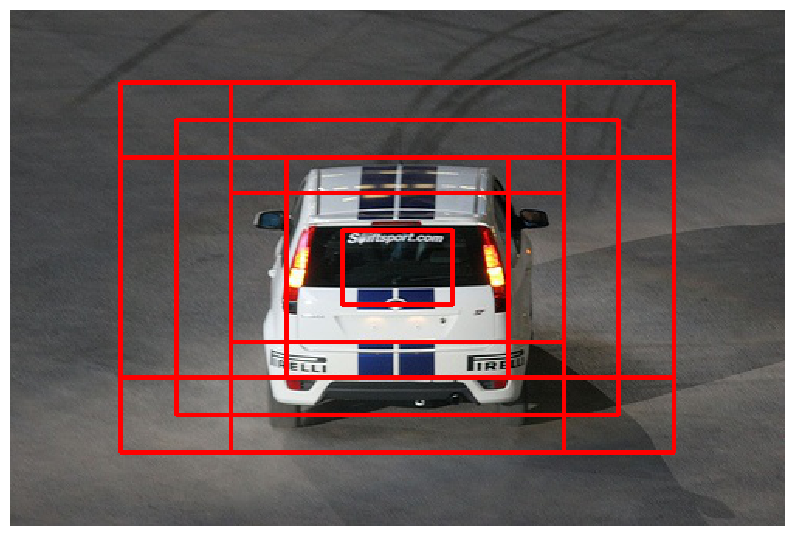

torch.Size([9, 1, 1, 4])


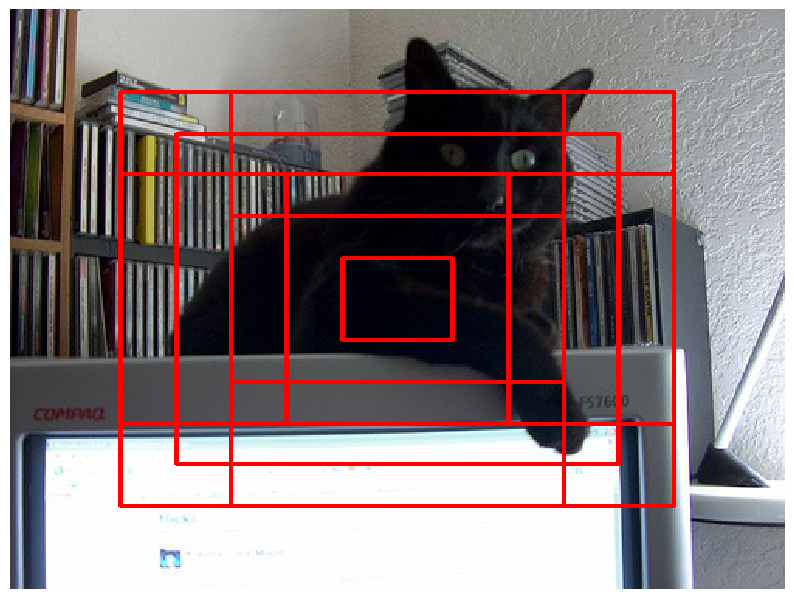

torch.Size([9, 1, 1, 4])


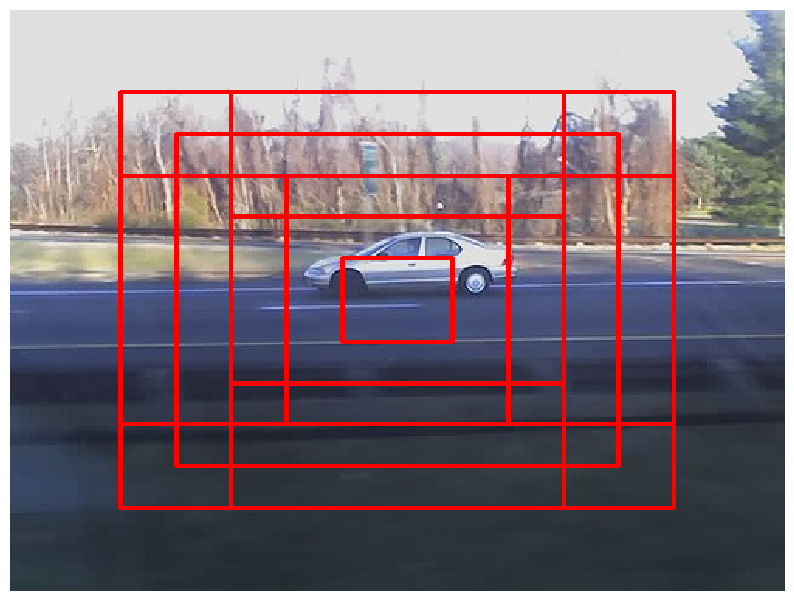

********************************************************************************
All anchors of the image (cluttered):
torch.Size([9, 7, 7, 4])


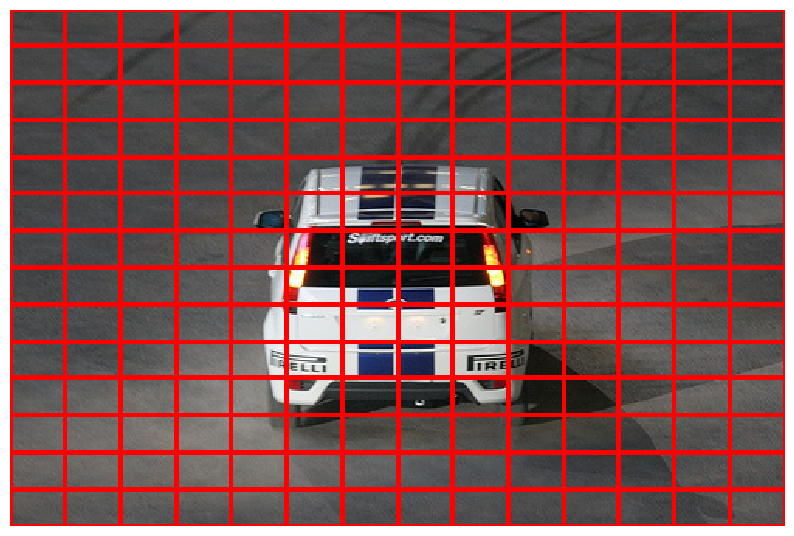

torch.Size([9, 7, 7, 4])


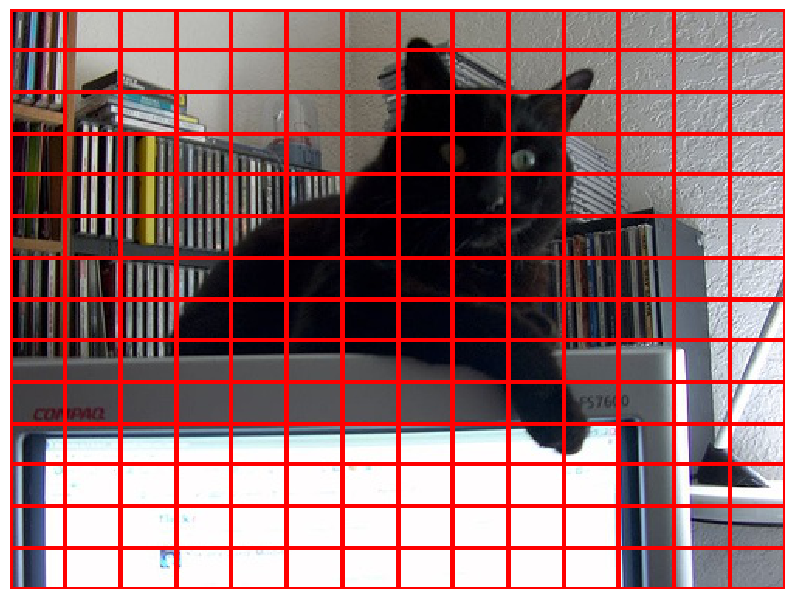

torch.Size([9, 7, 7, 4])


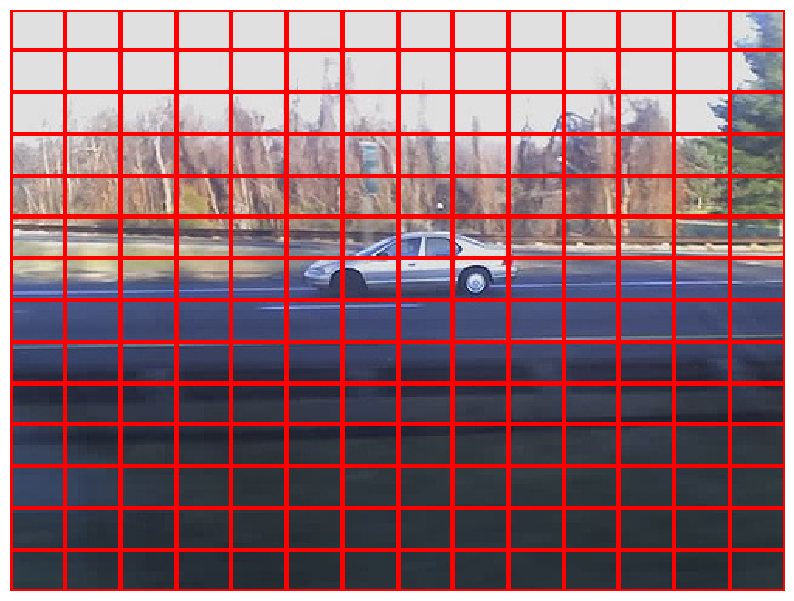

In [16]:
# visualization
print('*'*80)
print('All nine anchors should be exactly centered:')
anc_list = GenerateAnchor(anchor_list, grid_list[:, 3:4, 3:4])
for img, anc in zip(img_list, coord_trans(anc_list, w_list, h_list)):
  print(anc.shape)
  detection_visualizer(img, idx_to_class, anc.reshape(-1, 4))

print('*'*80)
print('All anchors of the image (cluttered):')
anc_list = GenerateAnchor(anchor_list, grid_list) # all
for img, anc in zip(img_list, coord_trans(anc_list, w_list, h_list)):
  print(anc.shape)
  detection_visualizer(img, idx_to_class, anc.reshape(-1, 4))


## Proposal Generator
If we only use anchors to propose object locations, we can only cover 9x7x7=441 regions in the image. What if an object does not fall into any of the regions? 
Hence, modern detectors predict transformations that convert anchor boxes into *region proposals*, i.e. refine anchor coordinates.

So far, we have represented anchors boxes by the coordinates of their top-left and bottom-right corners $(x_{tl}^a, y_{tl}^a, x_{br}^a, y_{br}^a)$. When converting anchors to proposals, it will be more convenient to parameterize boxes by the xy coordinate of their center, and their with and height: $(x_c^a,y_c^a,w^a,h^a)$.

Now, consider an anchor box with center, width and height $(x_c^a,y_c^a,w^a,h^a)$.
The network will predict a *transformation* $(t^x, t^y, t^w, t^h)$; applying this transformation to the anchor yields a *region proposal* with center, width and height $(x_c^p,y_c^p,w^p,h^p)$.

For YOLO, we assume that $t^x$ and $t^y$ are both in the range $-0.5\leq t^x,t^y\leq 0.5$, while $t^w$ and $t^h$ are real numbers in the range $(-\infty, \infty)$. Then we have:
- $x_c^p = x_c^a + t^x$
- $y_c^p = y_c^a + t^y$
- $w^p = w_a exp(t^w)$
- $h^p = h_a exp(t^h)$




### Training
During training, we compute the ground-truth transformation $(\hat{t^x}, \hat{t^y}, \hat{t^w}, \hat{t^h})$ that would transform the anchor box $(x_c^a,y_c^a,w^a,h^a)$ into the the ground-truth box $(x_c^{gt},y_c^{gt},w^{gt},h^{gt})$. We then apply a regression loss that penalizes differences between the predicted transform $(t^x, t^y, t^w, t^h)$ and the ground-truth transform.





In [17]:
def GenerateProposal(anchors, offsets, method='YOLO'):
  """
  Proposal generator.

  Inputs:
  - anchors: Anchor boxes, of shape (B, A, H', W', 4). Anchors are represented
    by the coordinates of their top-left and bottom-right corners.
  - offsets: Transformations of shape (B, A, H', W', 4) that will be used to
    convert anchor boxes into region proposals. The transformation
    offsets[b, a, h, w] = (tx, ty, tw, th) will be applied to the anchor
    anchors[b, a, h, w]. For YOLO, assume that tx and ty are in the range
    (-0.5, 0.5).
  - method: Which transformation formula to use, either 'YOLO' or 'FasterRCNN'
  
  Outputs:
  - proposals: Region proposals of shape (B, A, H', W', 4), represented by the
    coordinates of their top-left and bottom-right corners. Applying the
    transform offsets[b, a, h, w] to the anchor [b, a, h, w] should give the
    proposal proposals[b, a, h, w].
  
  """
  assert(method in ['YOLO', 'FasterRCNN'])
  proposals = None
  ##############################################################################
  # TODO: Given anchor coordinates and the proposed offset for each anchor,    #
  # compute the proposal coordinates using the transformation formulas above.  #
  ##############################################################################
  proposals = torch.zeros_like(anchors)
  
  # transform anchor parametrization from top-left, bottom-right coords to center+width,height
  anc_trans = torch.zeros_like(anchors)
  anc_trans[:, :, :, :, :2] = torch.stack([(anchors[:, :, :, :, 0] + anchors[:, :, :, :, 2])/2, (anchors[:, :, :, :, 1] + anchors[:, :, :, :, 3])/2], dim=-1) # center coords 
  anc_trans[:, :, :, :, 2:] = torch.stack([anchors[:, :, :, :, 2] - anchors[:, :, :, :, 0], anchors[:, :, :, :, 3] - anchors[:, :, :, :, 1]], dim=-1) # w, h
  
  new_anc_trans = anc_trans.clone() # avoid inplace operation
  new_anc_trans[:, :, :, :, :2] = new_anc_trans[:, :, :, :, :2] + offsets[:, :, :, :, :2] # add translation offsets 
  new_anc_trans[:, :, :, :, 2:] = new_anc_trans[:, :, :, :, 2:] * torch.exp(offsets[:, :, :, :, 2:]) # scale 
  
  # tansform back to top-left, bottom-right coords
  proposals[:, :, :, :, :2] =  torch.stack([new_anc_trans[:, :, :, :, 0] - new_anc_trans[:, :, :, :, 2]/2, new_anc_trans[:, :, :, :, 1] - new_anc_trans[:, :, :, :, 3]/2], dim=-1) # x_tl, y_tl
  proposals[:, :, :, :, 2:] =  torch.stack([new_anc_trans[:, :, :, :, 0] + new_anc_trans[:, :, :, :, 2]/2, new_anc_trans[:, :, :, :, 1] + new_anc_trans[:, :, :, :, 3]/2], dim=-1) # x_br, y_br
  
  ##############################################################################
  #                               END OF YOUR CODE                             #
  ##############################################################################
  return proposals


Run the following to check your implementation. You should see errors on the order of 1e-7 or less.

In [18]:
print('-' * 80)
print('Sanity check for YOLO.')
yolo_offset_list = torch.cat([torch.ones_like(anc_list[:, :, :, :, 0:2]).fill_(.5), torch.ones_like(anc_list[:, :, :, :, 2:4])], dim=-1)
yolo_proposal_list = GenerateProposal(anc_list, yolo_offset_list, 'YOLO') # no scaling

print('1. Center moved by ~0.5 cell')
print('rel error: ', rel_error(anc_list[0, 0, 0, :, 0:2] + (anc_list[0, 0, 0, :, 2:4] - anc_list[0, 0, 0, :, 0:2])/2.0 + 0.5, \
                               (yolo_proposal_list[0, 0, 0, :, 0:2] + (yolo_proposal_list[0, 0, 0, :, 2:4] - yolo_proposal_list[0, 0, 0, :, 0:2]) / 2.0)))

print('2. w/h changed by e')
print('rel error: ', rel_error((anc_list[0, 0, 0, :, 2:4] - anc_list[0, 0, 0, :, 0:2]) * torch.exp(torch.ones_like(anc_list[0, 0, 0, :, 0:2])), \
      (yolo_proposal_list[0, 0, 0, :, 2:4] - yolo_proposal_list[0, 0, 0, :, 0:2])))


print('-' * 80)
print('Sanity check for FasterRCNN.')
rcnn_offset_list = torch.ones_like(anc_list)
rcnn_proposal_list = GenerateProposal(anc_list, rcnn_offset_list, 'FasterRCNN')

print('1. x/y shifted by wh')
print('rel error: ', rel_error(anc_list[0, 0, 0, :, 0:2] + (anc_list[0, 0, 0, :, 2:4] - anc_list[0, 0, 0, :, 0:2]) * 3.0 /2.0, \
      (rcnn_proposal_list[0, 0, 0, :, 0:2] + (rcnn_proposal_list[0, 0, 0, :, 2:4] - rcnn_proposal_list[0, 0, 0, :, 0:2]) / 2.0)))

print('2. w/h should changed by e')
print('rel error: ', rel_error((anc_list[0, 0, 0, :, 2:4] - anc_list[0, 0, 0, :, 0:2]) * torch.exp(torch.ones_like(anc_list[0, 0, 0, :, 0:2])), \
      (rcnn_proposal_list[0, 0, 0, :, 2:4] - rcnn_proposal_list[0, 0, 0, :, 0:2])))

--------------------------------------------------------------------------------
Sanity check for YOLO.
1. Center moved by ~0.5 cell
rel error:  0.0
2. w/h changed by e
rel error:  8.770929630831571e-08
--------------------------------------------------------------------------------
Sanity check for FasterRCNN.
1. x/y shifted by wh
rel error:  0.0
2. w/h should changed by e
rel error:  8.770929630831571e-08


As an additional sanity check, we visualize an anchor (in red) and the corresponding proposal (in green) that results from applying the transform $(0.5, 0.5, 0, 0)$. The proposal should shift down and to the right

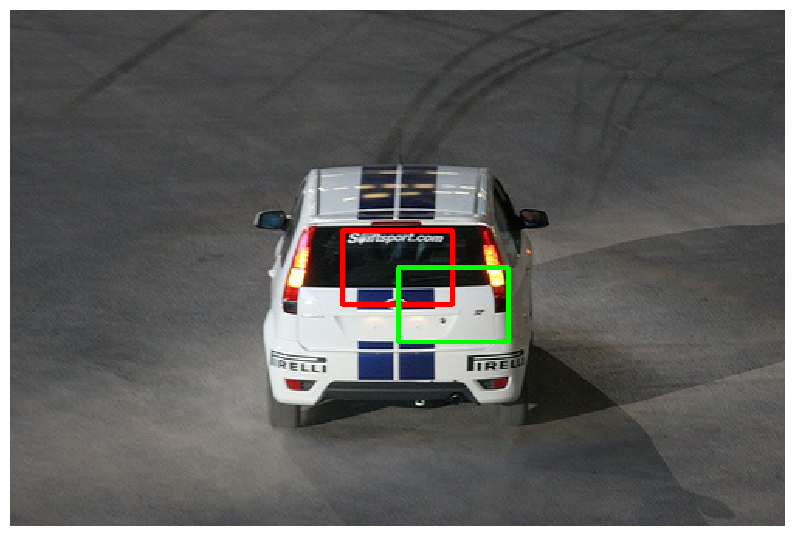

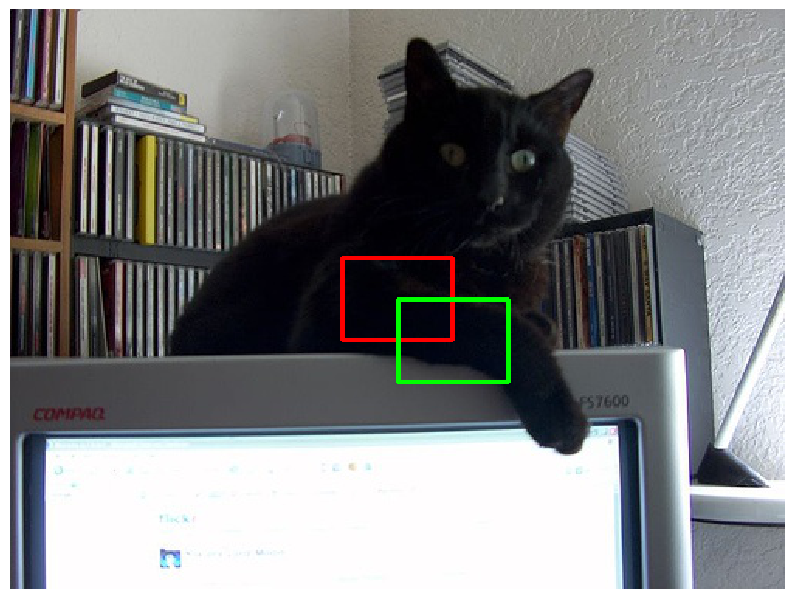

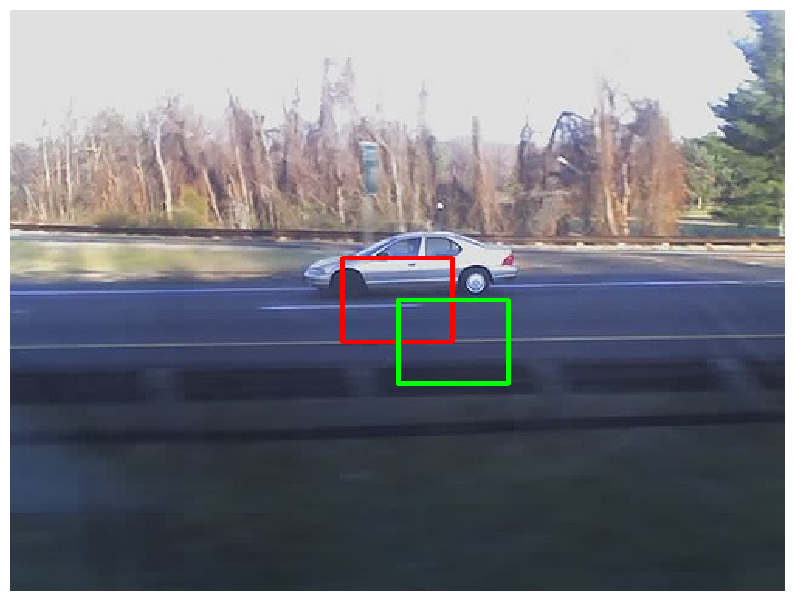

In [19]:
yolo_offset_list = torch.cat([torch.ones_like(anc_list[:, :, :, :, 0:2]).fill_(.5), torch.zeros_like(anc_list[:, :, :, :, 2:4])], dim=-1)
yolo_proposal_list = GenerateProposal(anc_list, yolo_offset_list, 'YOLO')

for img, anc, prop in zip(img_list, coord_trans(anc_list[:, 0:1, 3:4, 3:4, :], w_list, h_list), \
                          coord_trans(yolo_proposal_list[:, 0:1, 3:4, 3:4, :], w_list, h_list)):
  detection_visualizer(img, idx_to_class, anc.reshape(-1, 4), prop.reshape(-1, 4))

Next we visualize the effect of applying the transform $(0, 0, 1, 1)$ to the same anchor box (in red). Now the proposal (in green) should have the same center as the anchor, but the proposal should be larger.

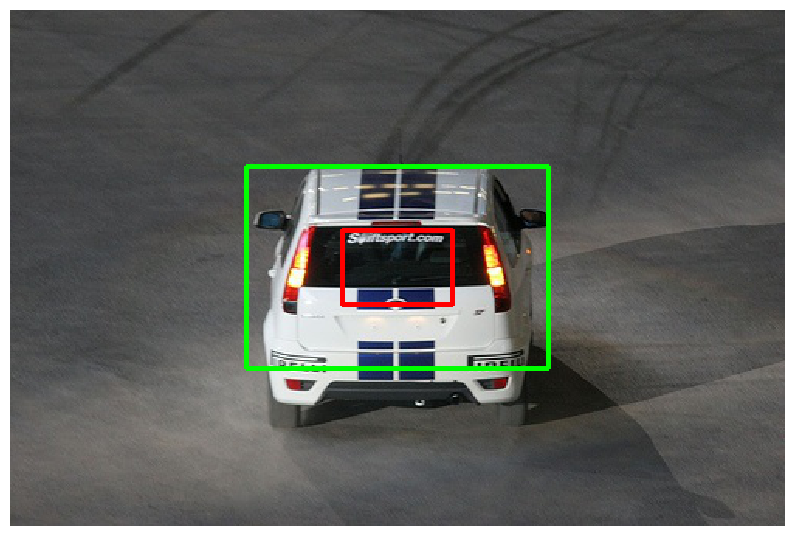

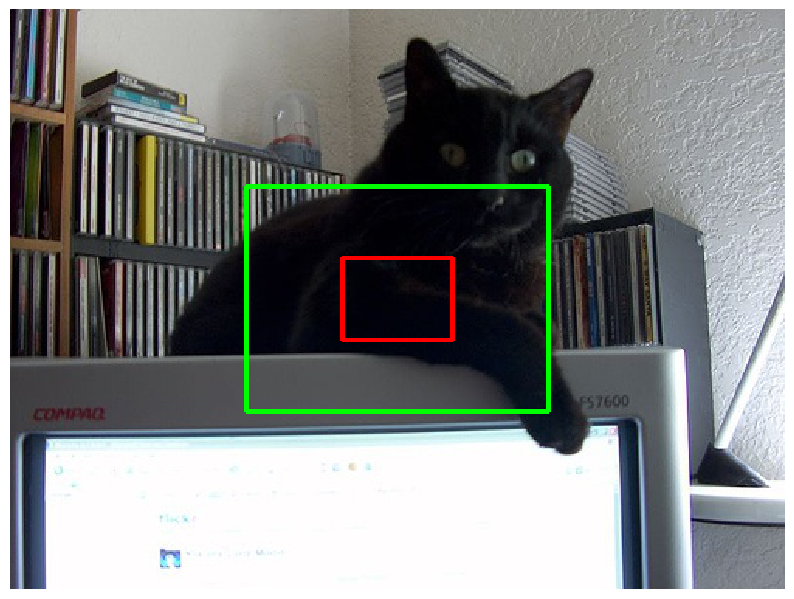

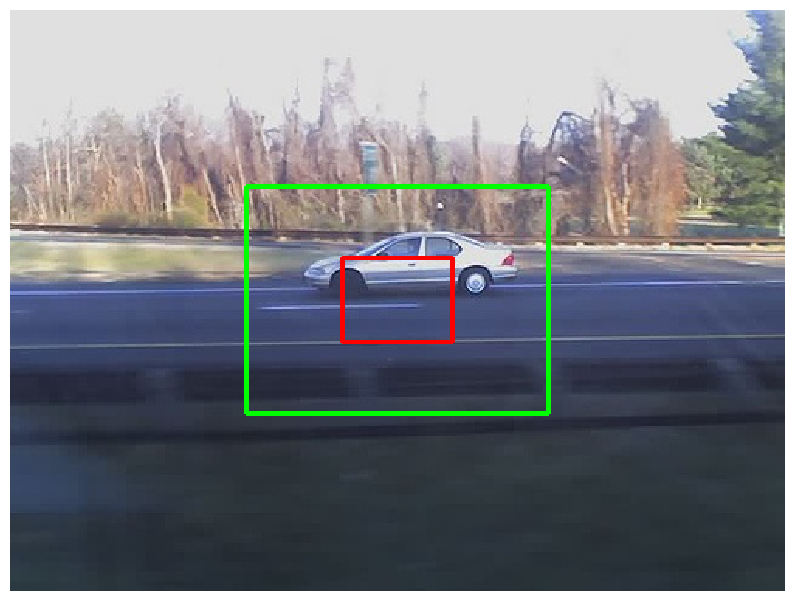

In [20]:
yolo_offset_list = torch.cat([torch.zeros_like(anc_list[:, :, :, :, 0:2]), torch.ones_like(anc_list[:, :, :, :, 2:4]).fill_(1.)], dim=-1)
yolo_proposal_list = GenerateProposal(anc_list, yolo_offset_list, 'YOLO')

for img, anc, prop in zip(img_list, coord_trans(anc_list[:, 0:1, 3:4, 3:4, :], w_list, h_list), \
                          coord_trans(yolo_proposal_list[:, 0:1, 3:4, 3:4, :], w_list, h_list)):
  detection_visualizer(img, idx_to_class, anc.reshape(-1, 4), prop.reshape(-1, 4))

# Prediction Networks
This module outputs the prediction scores (see figure below). We have provided the code to determine activated/negative anchors for you, though you need to implement the IoU function for it to work. You will also need to compute the loss function. The loss function consists of three parts, confidence score regression, bounding box offsets regression, and object classication.

![pred_scores](https://miro.medium.com/max/1055/1*YG6heD55fEmZeUKRSlsqlA.png)


Image credit: [towardsdatascience](https://towardsdatascience.com/yolov1-you-only-look-once-object-detection-e1f3ffec8a89). In this example, number of anchor shapes is $A=2$ while we have $A=9$.

## Intersection Over Union (IoU)




In [21]:
def IoU(proposals, bboxes):
  """
  Compute intersection over union between sets of bounding boxes.

  Inputs:
  - proposals: Proposals of shape (B, A, H', W', 4)
  - bboxes: Ground-truth boxes from the DataLoader of shape (B, N, 5).
    Each ground-truth box is represented as tuple (x_lr, y_lr, x_rb, y_rb, class).
    If image i has fewer than N boxes, then bboxes[i] will be padded with extra
    rows of -1.
  
  Outputs:
  - iou_mat: IoU matrix of shape (B, A*H'*W', N) where iou_mat[b, i, n] gives
    the IoU between one element of proposals[b] and bboxes[b, n].

  For this implementation you DO NOT need to filter invalid proposals or boxes;
  in particular you don't need any special handling for bboxxes that are padded
  with -1.
  """
  iou_mat = None
  ##############################################################################
  # TODO: Compute the Intersection over Union (IoU) on proposals and GT boxes. #
  # No need to filter invalid proposals/bboxes (i.e., allow region area <= 0). #
  # You need to ensure your implementation is efficient (no for loops).        #
  # HINT:                                                                      #
  # IoU = Area of Intersection / Area of Union, where
  # Area of Union = Area of Proposal + Area of BBox - Area of Intersection     #
  # and the Area of Intersection can be computed using the top-left corner and #
  # bottom-right corner of proposal and bbox. Think about their relationships. #
  ##############################################################################
  B, A, H, W,_ = proposals.shape
  _,N,_=bboxes.shape
  proposals = proposals.reshape(B,A*H*W,4)
  proposals = proposals.unsqueeze(2).repeat(1,1,N,1)
  iou_mat = torch.zeros((B,A*H*W,N),device=proposals.device)*-1
  # extract top-left and bottom right coordinates from bboxes, ans unsqueeze to match shape
  bboxesXtl=bboxes[:,:,0].unsqueeze(1)
  bboxesYtl=bboxes[:,:,1].unsqueeze(1)
  bboxesXbr=bboxes[:,:,2].unsqueeze(1)
  bboxesYbr=bboxes[:,:,3].unsqueeze(1) 

  # compute intersection corners (x1,y1) (x2,y2) between GT and proposals
  x1 = torch.max(proposals[:,:,:,0],bboxesXtl)
  y1 = torch.max(proposals[:,:,:,1],bboxesYtl) 
  x2 = torch.min(proposals[:,:,:,2],bboxesXbr)
  y2 = torch.min(proposals[:,:,:,3],bboxesYbr)
  
  # compute intersection area. Use torch.clamp to ensure non-negative areas
  intersection = torch.clamp((x2-x1), min=0)*torch.clamp((y2-y1), min=0)
  
  # compute Gt and proposal areas
  AreaGT = (bboxesXbr-bboxesXtl)*(bboxesYbr-bboxesYtl)
  AreaProp = (proposals[:,:,:,2]-proposals[:,:,:,0])*(proposals[:,:,:,3]-proposals[:,:,:,1])
    
  # compute IoU based on the areas computed above
  iou_mat = intersection/(AreaGT+AreaProp-intersection)
  
  ##############################################################################
  #                               END OF YOUR CODE                             #
  ##############################################################################
  return iou_mat

Run the following to check your implementation. You should see errors on the order of 1e-8 or less.

In [22]:
# from single_stage_detector import IoU

# simple sanity check
width = torch.tensor([35, 35], dtype=torch.float32, device='cuda')
heigh = torch.tensor([40, 40], dtype=torch.float32, device='cuda')
sample_bbox = torch.tensor([[[1,1,11,11,0], [20,20,30,30,0]]], dtype=torch.float32, device='cuda')
sample_proposals = torch.tensor([[[[[5,5,15,15], [27,27,37,37]]]]], dtype=torch.float32, device='cuda')

result = IoU(sample_proposals, sample_bbox)

# check 1
expected_result = torch.tensor([[[0.21951219, 0.00000000],
                                 [0.00000000, 0.04712042]]], dtype=torch.float32, device='cuda')
print('simple iou_mat error: ', rel_error(expected_result, result))

# check 2
iou_mat = IoU(anc_list, resized_box_list)
expected_iou_mat = torch.tensor([0.11666405, 0.15146968, 0.02956639], dtype=torch.float32, device='cuda')
print('iou_mat error: ', rel_error(expected_iou_mat, iou_mat[:, :, 0].mean(1)))

simple iou_mat error:  0.0
iou_mat error:  6.148574347282104e-09


## Activated (positive) and negative anchors

During training we need to match the ground-truth boxes against the anchors to determine the classification labels for the anchors -- which anchors should be classified as containing an object and which should be classified as background? We have written this part for you.

Read and digest the input/output definition carefully. You are highly recommended to read through the code as later parts rely heavily on this function. The function `ReferenceOnActivatedAnchors` is implemented in `a5_helper.py`.

Run the following to check the implementation. You should see errors on the order of 1e-7 or less.

In [23]:
# sanity check on YOLO (the one on Faster R-CNN is in A5-2)
activated_anc_ind, negative_anc_ind, GT_conf_scores, GT_offsets, GT_class, \
  activated_anc_coord, negative_anc_coord = ReferenceOnActivatedAnchors(anc_list, resized_box_list, grid_list, iou_mat, neg_thresh=0.2, method='YOLO')

expected_GT_conf_scores = torch.tensor([0.74538743, 0.72793430, 0.76044953, 0.37116671], device='cuda', dtype=torch.float32)
expected_GT_offsets = torch.tensor([[ 0.04900002,  0.35735703, -0.09431065,  0.19244696],
                                    [-0.14700007,  0.37299442, -0.00250307,  0.25213102],
                                    [-0.40600014,  0.09625626,  0.20863886, -0.07974572],
                                    [ 0.15399981, -0.42933345, -0.03459148, -0.86750042]], device='cuda', dtype=torch.float32)
expected_GT_class = torch.tensor([ 6,  7, 19,  6], device='cuda', dtype=torch.int64)
print('conf scores error: ', rel_error(GT_conf_scores, expected_GT_conf_scores))
print('offsets error: ', rel_error(GT_offsets, expected_GT_offsets))
print('class prob error: ', rel_error(GT_class, expected_GT_class))

number of pos proposals:  4
conf scores error:  0.0
offsets error:  4.294280664015343e-09
class prob error:  0.0


We can sanity check this function by visualizing ground-truth boxes (in red) along with positive / negative anchors (in green).

********************************************************************************
Activated (positive) anchors:
1 activated anchors!


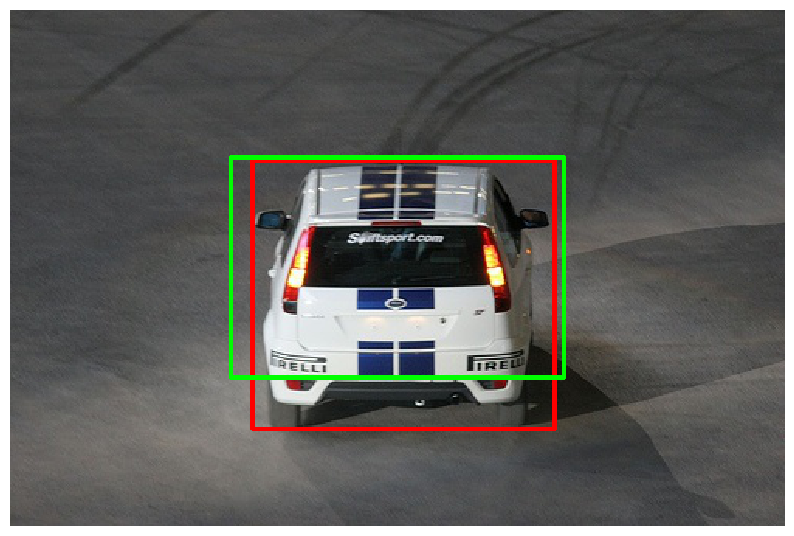

2 activated anchors!


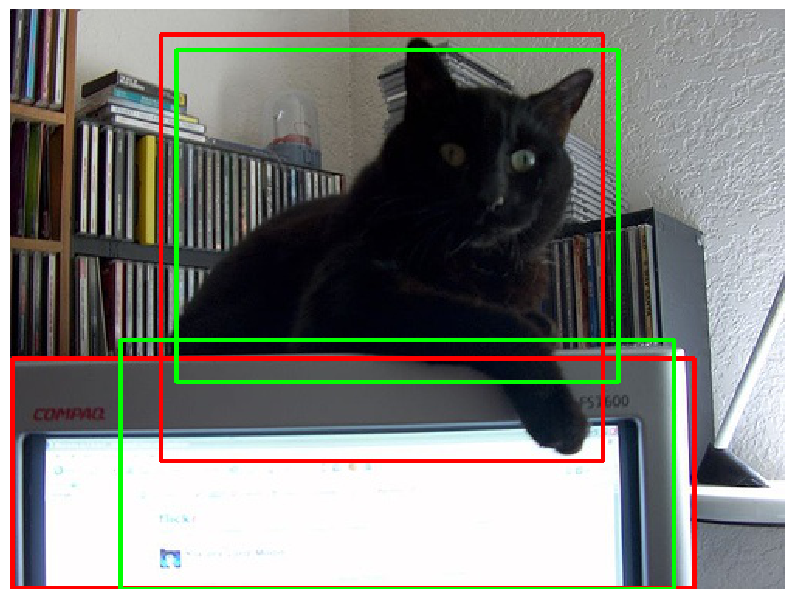

1 activated anchors!


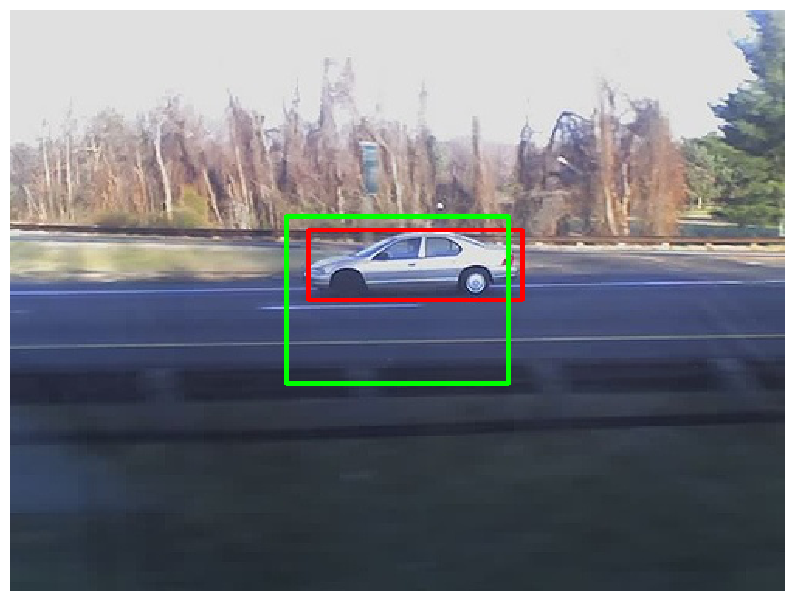

********************************************************************************
Negative anchors:
2 negative anchors!


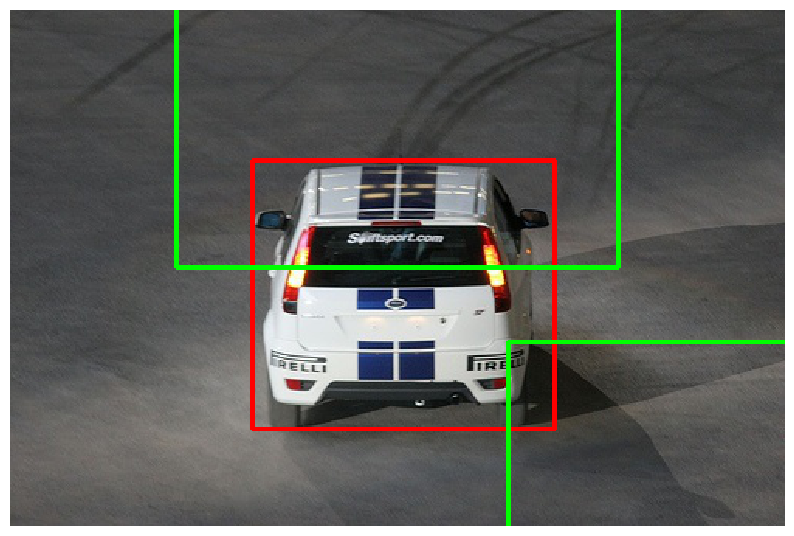

0 negative anchors!


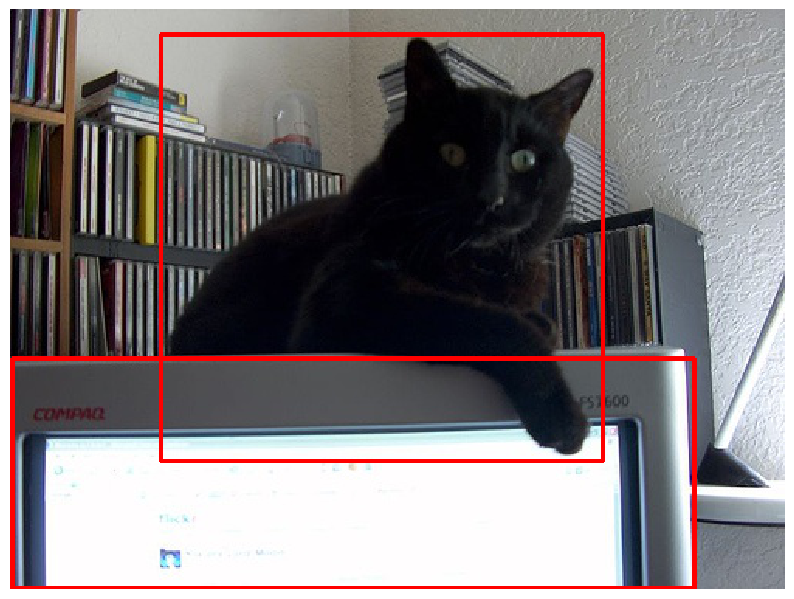

2 negative anchors!


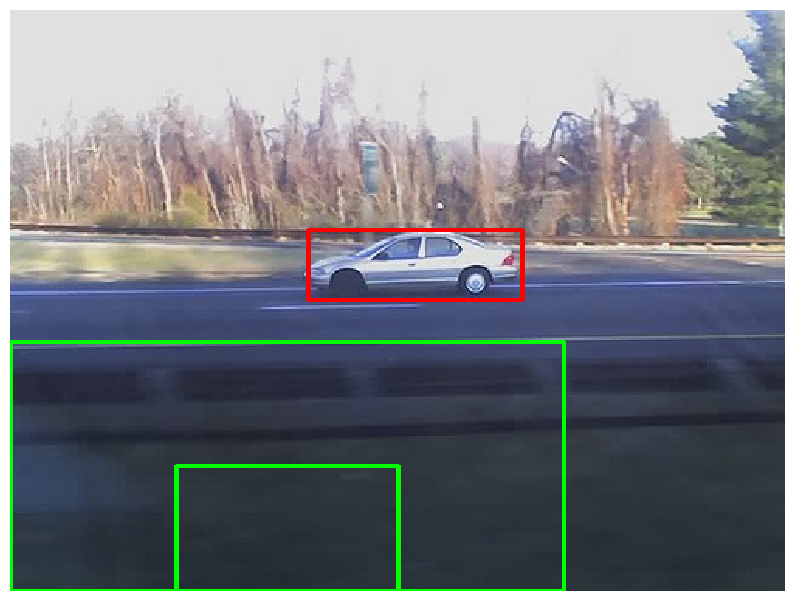

In [24]:
# visualize activated and negative anchors
anc_per_img = torch.prod(torch.tensor(anc_list.shape[1:-1]))

print('*'*80)
print('Activated (positive) anchors:')
for img, bbox, idx in zip(img_list, box_list, torch.arange(box_list.shape[0])):
  anc_ind_in_img = (activated_anc_ind >= idx * anc_per_img) & (activated_anc_ind < (idx+1) * anc_per_img)
  print('{} activated anchors!'.format(torch.sum(anc_ind_in_img)))
  detection_visualizer(img, idx_to_class, bbox[:, :4], coord_trans(activated_anc_coord[anc_ind_in_img], w_list[idx], h_list[idx]))

print('*'*80)
print('Negative anchors:')
for img, bbox, idx in zip(img_list, box_list, torch.arange(box_list.shape[0])):
  anc_ind_in_img = (negative_anc_ind >= idx * anc_per_img) & (negative_anc_ind < (idx+1) * anc_per_img)
  print('{} negative anchors!'.format(torch.sum(anc_ind_in_img)))
  detection_visualizer(img, idx_to_class, bbox[:, :4], coord_trans(negative_anc_coord[anc_ind_in_img], w_list[idx], h_list[idx]))

## Prediction Network
The prediction network inputs the features from the backbone network, and outputs the classification scores and transformations for each anchor.

For each position in the 7x7 grid of features from the backbone, the prediction network outputs C numbers to be interpreted as classification scores over the C object categories for the anchors at that position.

In addition, for each of the A anchors at each position, the prediction network outputs a transformation (4 numbers, to convert the anchor box into a region proposal) and a confidence score (where large positive values indicate high probability that the anchor contains an object, and large negative values indicate low probability that the anchor contains an object).

Collecting all of these outputs, we see that for each position in the 7x7 grid of features we need to output a total of `5A+C` numbers, so the prediction network receives an input tensor of shape `(B, 1280, 7, 7)` and produces an output tensor of shape `(B, 5A+C, 7, 7)`. We can achieve this with two `1x1` convolution layers operating on the input tensor, where the number of filters in the second layer is `5A+C`.

During training, we do not apply the loss on the full set of anchor boxes for the image; instead we designate a subset of anchors as positive and negative by matching them with ground-truth boxes as in the function above. The Prediction network is also responsible for picking out the outputs corresponding to the positive and negative anchors. These functions are given to you

Implement `PredictionNetwork`

In [25]:
class PredictionNetwork(nn.Module):
  def __init__(self, in_dim, hidden_dim=128, num_anchors=9, num_classes=20, drop_ratio=0.3):
    super().__init__()

    assert(num_classes != 0 and num_anchors != 0)
    self.num_classes = num_classes
    self.num_anchors = num_anchors

    ##############################################################################
    # TODO: Set up a network that will predict outputs for all anchors. This     #
    # network should have a 1x1 convolution with hidden_dim filters, followed    #
    # by a Dropout layer with p=drop_ratio, a Leaky ReLU nonlinearity, and       #
    # finally another 1x1 convolution layer to predict all outputs. You can      #
    # use an nn.Sequential for this network, and store it in a member variable.  #
    # HINT: The output should be of shape (B, 5*A+C, 7, 7), where                #
    # A=self.num_anchors and C=self.num_classes.                                 #
    ##############################################################################
    self.net = nn.Sequential(
      nn.Conv2d(in_dim, hidden_dim, kernel_size=1),
      nn.Dropout(p=drop_ratio),
      nn.LeakyReLU(),
      nn.Conv2d(hidden_dim, 5*self.num_anchors + self.num_classes, kernel_size=1)
    )
    
    ##############################################################################
    #                               END OF YOUR CODE                             #
    ##############################################################################

  def _extract_anchor_data(self, anchor_data, anchor_idx):
    """
    Inputs:
    - anchor_data: Tensor of shape (B, A, D, H, W) giving a vector of length
      D for each of A anchors at each point in an H x W grid.
    - anchor_idx: int64 Tensor of shape (M,) giving anchor indices to extract

    Returns:
    - extracted_anchors: Tensor of shape (M, D) giving anchor data for each
      of the anchors specified by anchor_idx.
    """
    B, A, D, H, W = anchor_data.shape
    anchor_data = anchor_data.permute(0, 1, 3, 4, 2).contiguous().view(-1, D)
    extracted_anchors = anchor_data[anchor_idx]
    return extracted_anchors
  
  def _extract_class_scores(self, all_scores, anchor_idx):
    """
    Inputs:
    - all_scores: Tensor of shape (B, C, H, W) giving classification scores for
      C classes at each point in an H x W grid.
    - anchor_idx: int64 Tensor of shape (M,) giving the indices of anchors at
      which to extract classification scores

    Returns:
    - extracted_scores: Tensor of shape (M, C) giving the classification scores
      for each of the anchors specified by anchor_idx.
    """
    B, C, H, W = all_scores.shape
    A = self.num_anchors
    all_scores = all_scores.contiguous().permute(0, 2, 3, 1).contiguous()
    all_scores = all_scores.view(B, 1, H, W, C).expand(B, A, H, W, C)
    all_scores = all_scores.reshape(B * A * H * W, C)
    extracted_scores = all_scores[anchor_idx]
    return extracted_scores

  def forward(self, features, pos_anchor_idx=None, neg_anchor_idx=None):
    """
    Run the forward pass of the network to predict outputs given features
    from the backbone network.

    Inputs:
    - features: Tensor of shape (B, in_dim, 7, 7) giving image features computed
      by the backbone network.
    - pos_anchor_idx: int64 Tensor of shape (M,) giving the indices of anchors
      marked as positive. These are only given during training; at test-time
      this should be None.
    - neg_anchor_idx: int64 Tensor of shape (M,) giving the indices of anchors
      marked as negative. These are only given at training; at test-time this
      should be None.
    
    The outputs from this method are different during training and inference.
    
    During training, pos_anchor_idx and neg_anchor_idx are given and identify
    which anchors should be positive and negative, and this forward pass needs
    to extract only the predictions for the positive and negative anchors.

    During inference, only features are provided and this method needs to return
    predictions for all anchors.

    Outputs (During training):
    - conf_scores: Tensor of shape (2*M, 1) giving the predicted classification
      scores for positive anchors and negative anchors (in that order).
    - offsets: Tensor of shape (M, 4) giving predicted transformation for
      positive anchors.
    - class_scores: Tensor of shape (M, C) giving classification scores for
      positive anchors.

    Outputs (During inference):
    - conf_scores: Tensor of shape (B, A, H, W) giving predicted classification
      scores for all anchors.
    - offsets: Tensor of shape (B, A, 4, H, W) giving predicted transformations
      all all anchors.
    - class_scores: Tensor of shape (B, C, H, W) giving classification scores for
      each spatial position.
    """
    conf_scores, offsets, class_scores = None, None, None
    ############################################################################
    # TODO: Use backbone features to predict conf_scores, offsets, and         #
    # class_scores. Make sure conf_scores is between 0 and 1 by squashing the  #
    # network output with a sigmoid. Also make sure the first two elements t^x #
    # and t^y of offsets are between -0.5 and 0.5 by squashing with a sigmoid  #
    # and subtracting 0.5.                                                     #
    #                                                                          #
    # During training you need to extract the outputs for only the positive    #
    # and negative anchors as specified above.                                 #
    #                                                                          #
    # HINT: You can use the provided helper methods self._extract_anchor_data  #
    # and self._extract_class_scores to extract information for positive and   #
    # negative anchors specified by pos_anchor_idx and neg_anchor_idx.         #
    ############################################################################
    A = self.num_anchors
    C = self.num_classes
    B, _, H, W = features.shape
    
    # use self.net to predict outputs for all anchors
    out = self.net(features) # (B, 5A+C, 7, 7)
        
    # retrieve anchor predictions and reshape them
    anchor_data = out[:, :5*A, :, :].view(B, A, 5, H, W)
    
    # retrieve class scores
    class_scores = out[:, -C:, :, :]
    
    # retrieve objectness scores from anchor_data. Apply a sigmoid to those scores
    conf_scores = torch.sigmoid(anchor_data[:, :, 0, :, :].view(B, A, 1, H, W))
    
    # retrieve anchor offsets from anchor_data.
    offsets = anchor_data[:, :, 1:, :, :].view(B, A, 4, H, W)
    
    # Make sure the first two elements t^x and t^y of offsets are between -0.5 
    # and 0.5 by squashing them with a sigmoid ([0,1]) and subtracting 0.5.                
    offsets[:, :, :2, :, :] = torch.sigmoid(offsets[:, :, :2, :, :]) - .5
    
    if pos_anchor_idx is None: # inference. Use all anchors
      conf_scores = conf_scores.squeeze()
      
    else: # training. Use positive and negative anchors
      # Use the self._extract_anchor_data and self._extract_class_scores functions
      # to obtain bbox offsets and class scores for positive anchors. Extract objectness scores
      # for positive and negative samples (pos, neg)
      offsets = self._extract_anchor_data(offsets, pos_anchor_idx) 
      class_scores = self._extract_class_scores(class_scores, pos_anchor_idx)
      pos = self._extract_anchor_data(conf_scores, pos_anchor_idx)  # (M, 1)
      neg = self._extract_anchor_data(conf_scores, neg_anchor_idx)  # (M, 1)
            
      conf_scores = torch.cat((pos, neg), dim=0) # (M, 2)

    ##############################################################################
    #                               END OF YOUR CODE                             #
    ##############################################################################
    return conf_scores, offsets, class_scores

Run the following to check your implementation. You should see errors on the order of 1e-7 or less.

In [26]:
# sanity check
reset_seed(0)
pred_network = PredictionNetwork(1280, drop_ratio=0).to(dtype=torch.float32, device='cuda')
features = torch.linspace(-10., 10., steps=3*1280*7*7, dtype=torch.float32, device='cuda').view(3, 1280, 7, 7)
pos_anchor_idx = torch.tensor([122, 605, 871, 955], dtype=torch.int64, device='cuda')
neg_anchor_idx = torch.tensor([1048, 1292, 1124, 1092], dtype=torch.int64, device='cuda')
conf_scores, offsets, class_prob = pred_network(features, pos_anchor_idx, neg_anchor_idx)

expected_conf_scores = torch.tensor([[0.85080749], [0.55230302], [0.45239496], [0.51819414],
                                     [0.38467780], [0.82627463], [0.53837817], [0.538446366]], dtype=torch.float32, device='cuda')
expected_offsets = torch.tensor([[-0.16344640,  0.45598251, -1.56108809, -1.96177566],
                                 [ 0.09087485, -0.11321104,  0.46109992,  0.13557276],
                                 [ 0.14098871, -0.04003078, -0.14689390,  0.01480492],
                                 [-0.22611487,  0.14513946, -1.26124716,  0.58137202]], dtype=torch.float32, device='cuda')
expected_class_prob = torch.tensor([0.88649291, 1.08752346, 0.90241265, 1.28021181, 0.77324629,
                                    -0.93609941, 1.44269419, -1.01072836, 0.09888625, -0.09179375,
                                    -0.48814785, -1.14749694, 0.24533349, -0.19522685, 0.21445289,
                                    0.91779679, 0.97305167, 1.01984429, -0.11932681, 0.34998628], dtype=torch.float32, device='cuda')

print('conf scores error: ', rel_error(conf_scores, expected_conf_scores))
print('offsets error: ', rel_error(offsets, expected_offsets))
print('class prob error: ', rel_error(class_prob.mean(0), expected_class_prob))

conf scores error:  7.050888853332825e-05
offsets error:  0.00028194221484932527
class prob error:  0.00022932255036751096


## Loss Function
The confidence score regression loss is for both activated/negative anchors while the bounding box regression loss and the object classification loss are for activated anchors only. 


`ObjectClassification` and `ConfScoreRegression` are already implemented for you. Next, you will have to implement the `BboxRegression` loss.

The `FocalLoss` will be implemented and added when you finish the first version of this notebook


In [27]:
def FocalLoss(output, target, focusing_param=5, balance_param=0.25):
    """
    Computes the focal loss for a classification problem
    :param output: Output obtained by the network
    :param target: Ground-truth labels
    :return: Focal loss
    """
    # Compute the regular cross entropy between the output and the target. This is equal to -log(pt)
    logpt = -torch.nn.functional.cross_entropy(output, target, reduction='none')
    
    # Compute pt
    pt = torch.exp(logpt)**-1
    
    # Compute focal loss
    focal_loss = (-(1-pt)**focusing_param)*logpt
    # Apply weighting factor to obtain balanced focal loss
    balanced_focal_loss = balance_param * focal_loss
    
    return balanced_focal_loss

In [28]:
def ObjectClassification(class_prob, GT_class, batch_size, anc_per_img, activated_anc_ind):
  """"
  Use softmax loss

  Inputs:
  - class_prob: Predicted class logits
  - GT_class: GT box class label
  
  Outputs:
  - object_cls_loss
  """
  # average within sample and then average across batch
  # such that the class pred would not bias towards dense popular objects like `person`
  
  # Focal Loss
  # all_loss = FocalLoss(class_prob, GT_class, focusing_param=5, balance_param=0.25)
  
  # YOLO loss
  all_loss = torch.nn.functional.cross_entropy(class_prob, GT_class, reduction='none')
  # object_cls_loss = torch.sum(all_loss)

  # Select only positive anchors as training samples for the classification task
  # To be commented in the last tests of the notebook 
  #'''
  object_cls_loss = 0
  for idx in range(batch_size):
    anc_ind_in_img = (activated_anc_ind >= idx * anc_per_img) & (activated_anc_ind < (idx+1) * anc_per_img)
    object_cls_loss += all_loss[anc_ind_in_img].sum() * 1. / torch.sum(anc_ind_in_img)
  #'''

  object_cls_loss /= batch_size

  return object_cls_loss


In [29]:
def ConfScoreRegression(conf_scores, GT_conf_scores):
  """
  Use sum-squared error as in YOLO

  Inputs:
  - conf_scores: Predicted confidence scores
  - GT_conf_scores: GT confidence scores
  
  Outputs:
  - conf_score_loss
  """
  # the target conf_scores for negative samples are zeros
  GT_conf_scores = torch.cat((torch.ones_like(GT_conf_scores), \
                              torch.zeros_like(GT_conf_scores)), dim=0).view(-1, 1)
  print (GT_conf_scores.shape)
  
  conf_score_loss = torch.sum((conf_scores - GT_conf_scores)**2) * 1. / GT_conf_scores.shape[0]
  return conf_score_loss

In [30]:
def BboxRegression(offsets, GT_offsets):
  """"
  Use sum-squared error as in YOLO
  For both tx,ty and tw,th

  Inputs:
  - offsets: Predicted box offsets
  - GT_offsets: GT box offsets
  
  Outputs:
  - bbox_reg_loss
  """
  
  # compute sum of squared errors of the offsets 
  bbox_reg_loss = torch.sum((offsets - GT_offsets)**2)
  # mini-batch average
  bbox_reg_loss = bbox_reg_loss * 1. / GT_offsets.shape[0]
  return bbox_reg_loss

Run the following to check your implementation. You should see errors on the order of 1e-8 or less.

In [31]:
# sanity check
from single_stage_detector import ConfScoreRegression, BboxRegression

conf_loss = ConfScoreRegression(conf_scores, GT_conf_scores)
reg_loss = BboxRegression(offsets, GT_offsets)
cls_loss = ObjectClassification(class_prob, GT_class, w_list.shape[0], anc_per_img, activated_anc_ind)
print('conf loss: {:.4f}, reg loss: {:.4f}, cls loss: {:.4f}'.format(conf_loss, reg_loss, cls_loss))

loss_all = torch.tensor([conf_loss.data, reg_loss.data, cls_loss.data], device='cuda', dtype=torch.float32)
expected_loss = torch.tensor([0.27064770460128784, 2.9750006198883057, 2.3919472694396973], device='cuda', dtype=torch.float32)

print('loss error: ', rel_error(loss_all, expected_loss))

conf loss: 0.2707, reg loss: 2.9750, cls loss: 2.3918
loss error:  2.4322624913708778e-05


# Train an object detector

## Object detection module

We will now combine everything into the `SingleStageDetector` class. In the next cell we define the class head and the `forward` method. Later, we will implement an inference method and add it to the `SingleStageDetector` class.

Implement the `forward` method of our detector. This implements the training-time forward pass: it receives the input images and the ground-truth bounding boxes, and returns the total loss for the minibatch.

In [32]:
class SingleStageDetector(nn.Module):
  def __init__(self):
    super().__init__()

    self.anchor_list = torch.tensor([[1., 1], [2, 2], [3, 3], [4, 4], [5, 5], [2, 3], [3, 2], [3, 5], [5, 3]]) # READ ONLY
    self.feat_extractor = FeatureExtractor()
    self.num_classes = 20
    self.pred_network = PredictionNetwork(1280, num_anchors=self.anchor_list.shape[0], \
                                          num_classes=self.num_classes)
  def forward(self, images, bboxes):
    """
    Training-time forward pass for the single-stage detector.

    Inputs:
    - images: Input images, of shape (B, 3, 224, 224)
    - bboxes: GT bounding boxes of shape (B, N, 5) (padded)

    Outputs:
    - total_loss: Torch scalar giving the total loss for the batch.
    """
    # weights to multiple to each loss term
    w_conf = 1 # for conf_scores
    w_reg = 1 # for offsets
    w_cls = 1 # for class_prob

    total_loss = None
    ##############################################################################
    # TODO: Implement the forward pass of SingleStageDetector.                   #
    # A few key steps are outlined as follows:                                   #
    # i) Image feature extraction,                                               #
    # ii) Grid and anchor generation,                                            #
    # iii) Compute IoU between anchors and GT boxes and then determine activated/#
    #      negative anchors, and GT_conf_scores, GT_offsets, GT_class,           #
    # iv) Compute conf_scores, offsets, class_prob through the prediction network#
    # v) Compute the total_loss which is formulated as:                          #
    #    total_loss = w_conf * conf_loss + w_reg * reg_loss + w_cls * cls_loss,  #
    #    where conf_loss is determined by ConfScoreRegression, w_reg by          #
    #    BboxRegression, and w_cls by ObjectClassification.                      #
    ##############################################################################
    B, N, _ = bboxes.shape
    A = len(self.anchor_list)

    # i) backbone CNN feature extraction
    features = self.feat_extractor(images) # (B, 1280, 7, 7)
    
    # ii) create the grid using GenerateGrid (implemented in a5_helper.py)
    grid_list = GenerateGrid(B)
    
    # generate the anchors using GenerateAnchor 
    anc_list = GenerateAnchor(self.anchor_list, grid_list)
        
    # iii) compute iou:
    iou_mat = IoU(anc_list, bboxes) # (B, A*H'*W', N)
    
    # match the ground-truth boxes against the anchors to determine the classification labels for the anchors
    activated_anc_ind, negative_anc_ind, GT_conf_scores, GT_offsets, GT_class, \
      activated_anc_coord, negative_anc_coord = ReferenceOnActivatedAnchors(anc_list, bboxes, grid_list, iou_mat, neg_thresh=0.2, method='YOLO')
    
    # i) use self.pred_network to obtain all predictions from the features. 
    # Remember that self.pred_network runs the fordward function of the PredictionNetwork class. 
    # Since we are running the training forward-pass, use the positive and negative indices computed just before to identify    
    conf_scores, offsets, class_scores = self.pred_network(features, activated_anc_ind, negative_anc_ind)
    
    # Compute the objectness score and bbox regression losses. Use GT objectness scores and bbox offsets computed before
    conf_loss = ConfScoreRegression(conf_scores, GT_conf_scores)
    reg_loss = BboxRegression(offsets, GT_offsets)
    
    # classification loss
    anc_per_img = torch.prod(torch.tensor(anc_list.shape[1:-1]))
    cls_loss = ObjectClassification(class_scores, GT_class, B, anc_per_img, activated_anc_ind)

    # multi-task loss. Compute a weighted multi-task loss weighted by the w_conf, w_reg and w_cls weights
    total_loss = w_conf*conf_loss + w_reg*reg_loss + w_cls*cls_loss
        
    ##############################################################################
    #                               END OF YOUR CODE                             #
    ##############################################################################

    return total_loss

## Overfit small data
To make sure that everything is working as expected, we can try to overfit the detector to a small subset of data.

After 200 epochs of training you should see a total loss of around or less than 0.3.


We also implemented the `DetectionSolver` object which runs the training loop to train an single stage detector. You can inspect the DetectionSolver implementation in `single_stage_detector.py`. 

lr:  0.01
number of pos proposals:  43
(Iter 0 / 1)
(Epoch 0 / 200) loss: 4.9171 time per epoch: 0.4s
number of pos proposals:  43
(Iter 0 / 1)
(Epoch 1 / 200) loss: 3.3855 time per epoch: 0.1s
number of pos proposals:  43
(Iter 0 / 1)
(Epoch 2 / 200) loss: 2.7941 time per epoch: 0.1s
number of pos proposals:  43
(Iter 0 / 1)
(Epoch 3 / 200) loss: 2.3112 time per epoch: 0.1s
number of pos proposals:  43
(Iter 0 / 1)
(Epoch 4 / 200) loss: 1.9175 time per epoch: 0.1s
number of pos proposals:  43
(Iter 0 / 1)
(Epoch 5 / 200) loss: 1.7261 time per epoch: 0.1s
number of pos proposals:  43
(Iter 0 / 1)
(Epoch 6 / 200) loss: 1.5528 time per epoch: 0.1s
number of pos proposals:  43
(Iter 0 / 1)
(Epoch 7 / 200) loss: 1.5450 time per epoch: 0.1s
number of pos proposals:  43
(Iter 0 / 1)
(Epoch 8 / 200) loss: 1.5997 time per epoch: 0.1s
number of pos proposals:  43
(Iter 0 / 1)
(Epoch 9 / 200) loss: 1.4993 time per epoch: 0.1s
number of pos proposals:  43
(Iter 0 / 1)
(Epoch 10 / 200) loss: 1.255

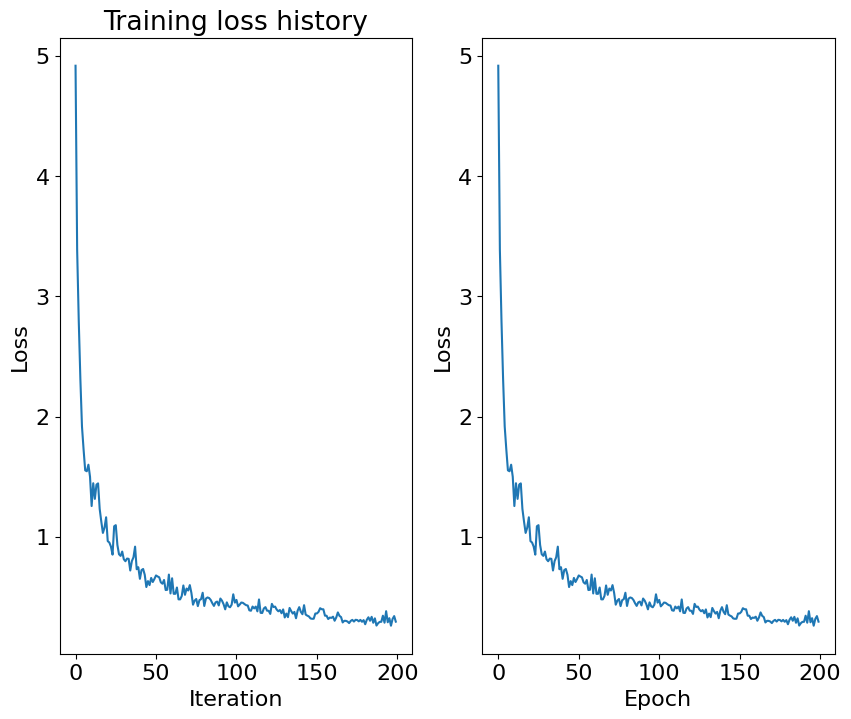

In [34]:
#from single_stage_detector import DetectionSolver, SingleStageDetector

# monitor the training loss
reset_seed(0)
num_sample = 10
small_dataset = torch.utils.data.Subset(train_dataset, torch.linspace(0, len(train_dataset)-1, steps=num_sample).long())
small_train_loader = pascal_voc2007_loader(small_dataset, 10) # a new loader

for lr in [1e-2]:
  print('lr: ', lr)
  detector = SingleStageDetector()
  DetectionSolver(detector, small_train_loader, learning_rate=lr, num_epochs=200, dtype=torch.float32, device='cuda')

## Train a net

Now that we are confident that the training code is working properly, let's train the network on more data and for longer. We will train for 50 epochs; this should take about 35 minutes on a K80 GPU. You should see a total loss around or less than 0.27.

For initial debugging, you may want to train for a smaller number of epochs; training for 5 epochs, you can expect a loss of around 1.0. 

Note that real object detection systems typically train for 12-24 hours, distribute training over multiple GPUs, and use much faster GPUs. As such our result will be far from the state of the art, but it should give some reasonable results!


number of pos proposals:  283
(Iter 0 / 25)
number of pos proposals:  367
(Iter 1 / 25)
number of pos proposals:  298
(Iter 2 / 25)
number of pos proposals:  297
(Iter 3 / 25)
number of pos proposals:  298
(Iter 4 / 25)
number of pos proposals:  258
(Iter 5 / 25)
number of pos proposals:  329
(Iter 6 / 25)
number of pos proposals:  332
(Iter 7 / 25)
number of pos proposals:  303
(Iter 8 / 25)
number of pos proposals:  306
(Iter 9 / 25)
number of pos proposals:  276
(Iter 10 / 25)
number of pos proposals:  303
(Iter 11 / 25)
number of pos proposals:  282
(Iter 12 / 25)
number of pos proposals:  324
(Iter 13 / 25)
number of pos proposals:  295
(Iter 14 / 25)
number of pos proposals:  304
(Iter 15 / 25)
number of pos proposals:  317
(Iter 16 / 25)
number of pos proposals:  309
(Iter 17 / 25)
number of pos proposals:  344
(Iter 18 / 25)
number of pos proposals:  355
(Iter 19 / 25)
number of pos proposals:  352
(Iter 20 / 25)
number of pos proposals:  381
(Iter 21 / 25)
number of pos propos

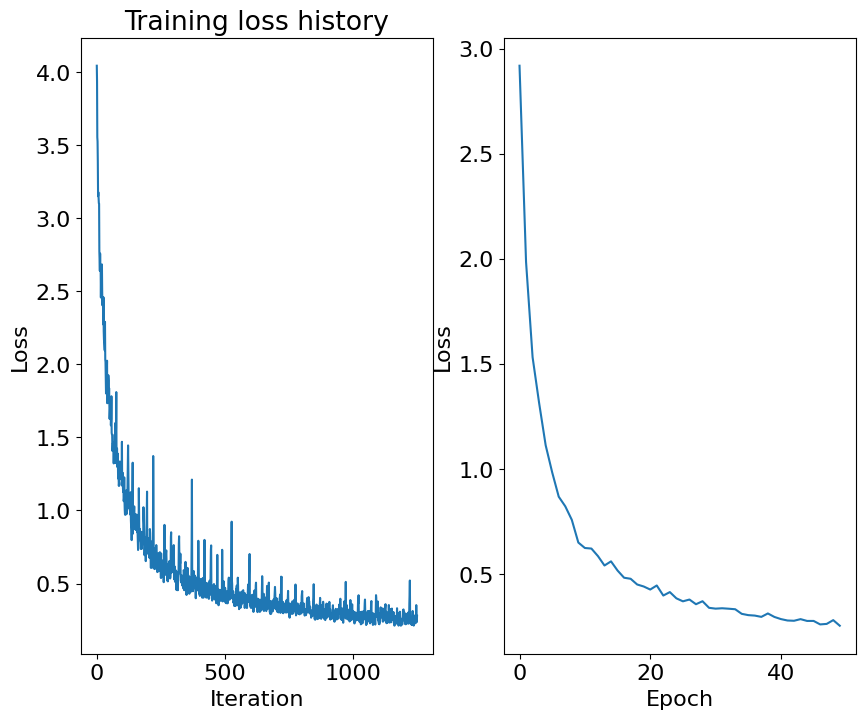

In [35]:
# monitor the training loss
train_loader = pascal_voc2007_loader(train_dataset, 100)

lr = 5e-2
num_epochs = 50
yolo_detector = SingleStageDetector().to(dtype=torch.float32, device='cuda')
DetectionSolver(yolo_detector, train_loader, learning_rate=lr, num_epochs=num_epochs, dtype=torch.float32, device='cuda')

After you've trained your model, save the weights . Feel free to comment some of those lines to load earlier checkpoints. We evaluate the detector after loading as a sanity check.

In [35]:
weights_path = os.path.join(GOOGLE_DRIVE_PATH, "yolo_detector.pt")
#torch.save(yolo_detector.state_dict(), weights_path)

yolo_detector = SingleStageDetector().to(dtype=torch.float32, device='cuda')
yolo_detector.load_state_dict(torch.load(weights_path))
DetectionEvaluater(yolo_detector, train_loader, dtype=torch.float32, device='cuda')


number of pos proposals:  26
number of pos proposals:  26
number of pos proposals:  30
number of pos proposals:  26
number of pos proposals:  22
number of pos proposals:  34
number of pos proposals:  35
number of pos proposals:  26
number of pos proposals:  27
number of pos proposals:  31
number of pos proposals:  22
number of pos proposals:  40
number of pos proposals:  30
number of pos proposals:  39
number of pos proposals:  71
number of pos proposals:  35
number of pos proposals:  35
number of pos proposals:  34
number of pos proposals:  28
number of pos proposals:  33
number of pos proposals:  26
number of pos proposals:  47
number of pos proposals:  29
number of pos proposals:  32
number of pos proposals:  24
number of pos proposals:  33
number of pos proposals:  29
number of pos proposals:  23
number of pos proposals:  27
number of pos proposals:  28
number of pos proposals:  22
number of pos proposals:  28
number of pos proposals:  35
number of pos proposals:  37
number of pos 

tensor(0.2183, device='cuda:0')

# Use an object detector

## Inference

Now, implement the inference part of module `SingleStageDetector`. Note that this function is added to the `SingleStageDetector` class defined above, so you have acces to the `self` methods and variables 



In [36]:
def detector_inference(self, images, thresh=0.5, nms_thresh=0.7):
  """"
  Inference-time forward pass for the single stage detector.

  Inputs:
  - images: Input images
  - thresh: Threshold value on confidence scores
  - nms_thresh: Threshold value on NMS

  Outputs:
  - final_propsals: Keeped proposals after confidence score thresholding and NMS,
                    a list of B (*x4) tensors
  - final_conf_scores: Corresponding confidence scores, a list of B (*x1) tensors
  - final_class: Corresponding class predictions, a list of B  (*x1) tensors
  """
  final_proposals, final_conf_scores, final_class = [], [], []
  ##############################################################################
  # TODO: Predicting the final proposal coordinates `final_proposals`,         #
  # confidence scores `final_conf_scores`, and the class index `final_class`.  #
  # The overall steps are similar to the forward pass but now you do not need  #
  # to decide the activated nor negative anchors.                              #
  # HINT: Thresholding the conf_scores based on the threshold value `thresh`.  #
  # Then, apply NMS (torchvision.ops.nms) to the filtered proposals given the  #
  # threshold `nms_thresh`.                                                    #
  # The class index is determined by the class with the maximal probability.   #
  # Note that `final_propsals`, `final_conf_scores`, and `final_class` are all #
  # lists of B 2-D tensors (you may need to unsqueeze dim=1 for the last two). #
  ##############################################################################
  with torch.no_grad():
    B = images.shape[0]
    A = len(self.anchor_list)
    
    # feature extraction
    features = self.feat_extractor(images) # (B, 1280, 7, 7)
    _, _, H, W = features.shape
    
    # Grid and Anchor generation
    grid_list = GenerateGrid(B)
    anc_list = GenerateAnchor(self.anchor_list, grid_list)
    
    # predict scores
    conf_scores, offsets, class_scores = self.pred_network(features)
    C = class_scores.shape[1]
    
    # Permute offsets for proposal generation 
    offsets = offsets.permute(0, 1, 3, 4, 2).contiguous() # B, A, 7, 7, 4
    # generate proposals 
    proposals = GenerateProposal(anc_list, offsets)
    
    for b in range(B): # loop over samples in the batch
      # re-shape to find maximum class-score per grid cell
      expand_class = class_scores[b].permute(1,2,0).unsqueeze(0).expand(A, H, W, C) # A * 7 * 7 * C
      # find the predicted class per grid cell (and anchor)
      picked_class = torch.argmax(expand_class, dim=-1).unsqueeze(-1) # A* 7 * 7 * 1
      
      # keep objectness scores over threshold only
      thresh_index = torch.nonzero((conf_scores[b] > thresh), as_tuple=True)
      conf_scores_masked = conf_scores[b][thresh_index].view(-1) 
      class_score_masked = picked_class[thresh_index].view(-1) 
      proposal_masked = proposals[b][thresh_index].view(-1, 4) 
      
      # use torchvision.ops.nms to find the indices of proposals kept after NMS
      proposals_left = torchvision.ops.nms(proposal_masked, conf_scores_masked, nms_thresh)
              
      final_proposals.append(proposal_masked[proposals_left]) #(*x4)
      final_conf_scores.append(conf_scores_masked[proposals_left].unsqueeze(1)) #(*x1)
      final_class.append(class_score_masked[proposals_left].unsqueeze(1)) #(*x1)
  
  ##############################################################################
  #                               END OF YOUR CODE                             #
  ##############################################################################
  return final_proposals, final_conf_scores, final_class


In [37]:
SingleStageDetector.inference = detector_inference

Once you're done, test your implementation using the overfitted model weights on a small set of training samples. Visualize the output from the overfitted model on the small dataset by running the code box below, the bounding boxes should be really accurate.

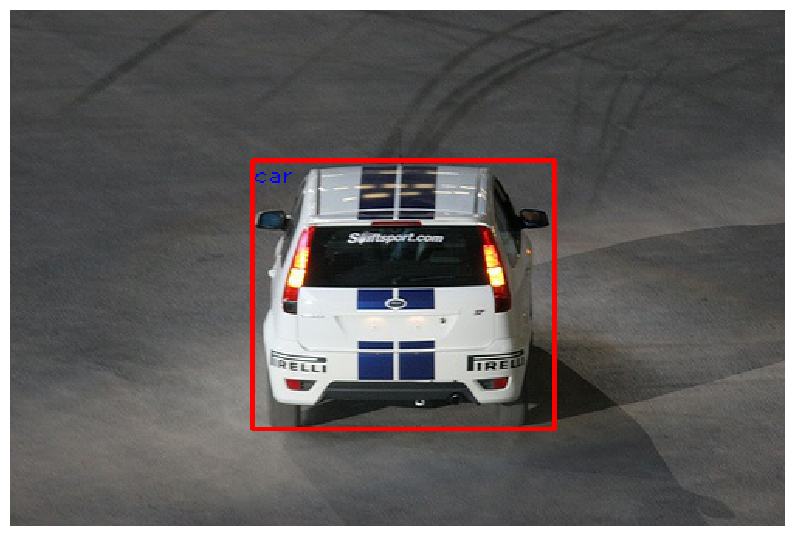

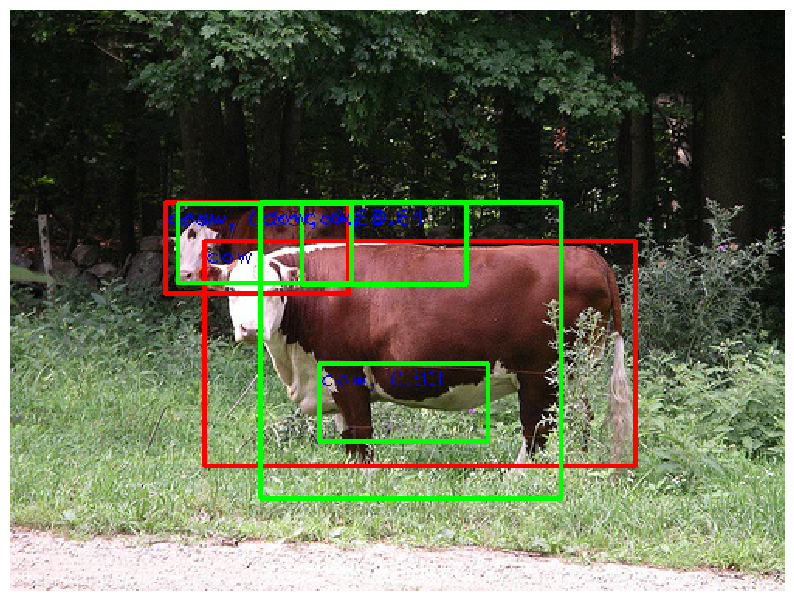

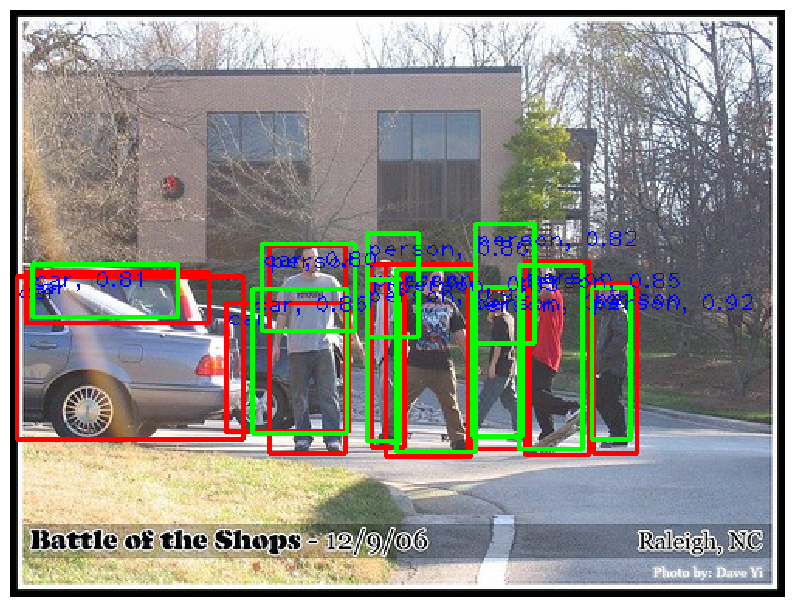

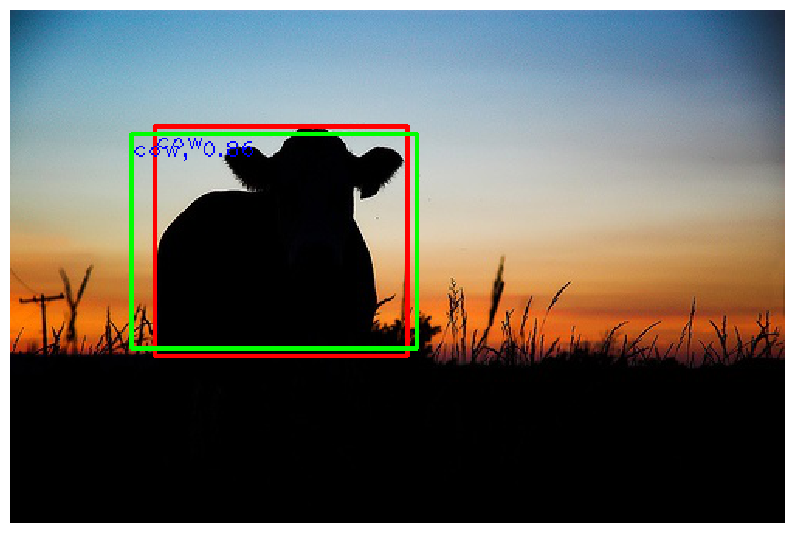

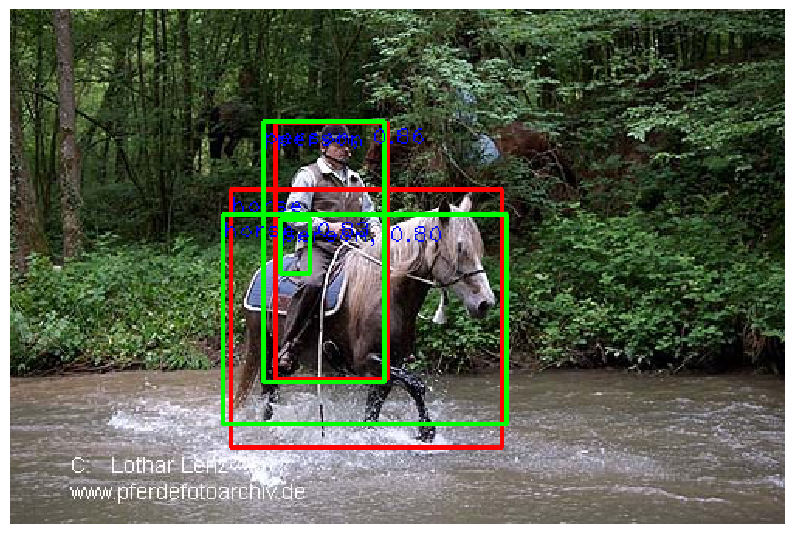

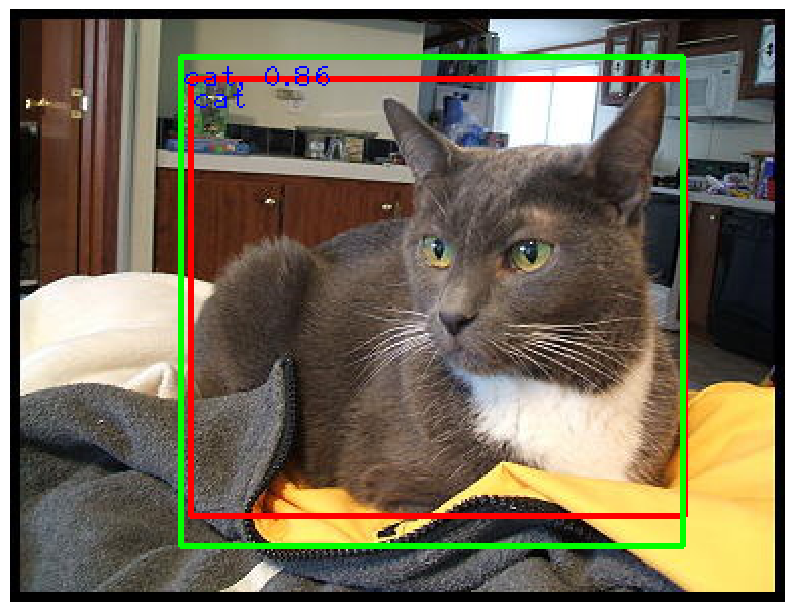

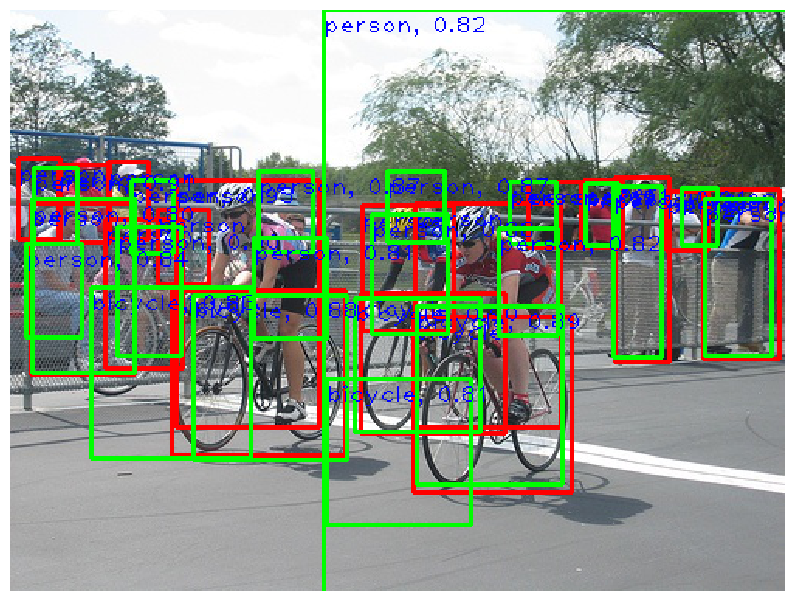

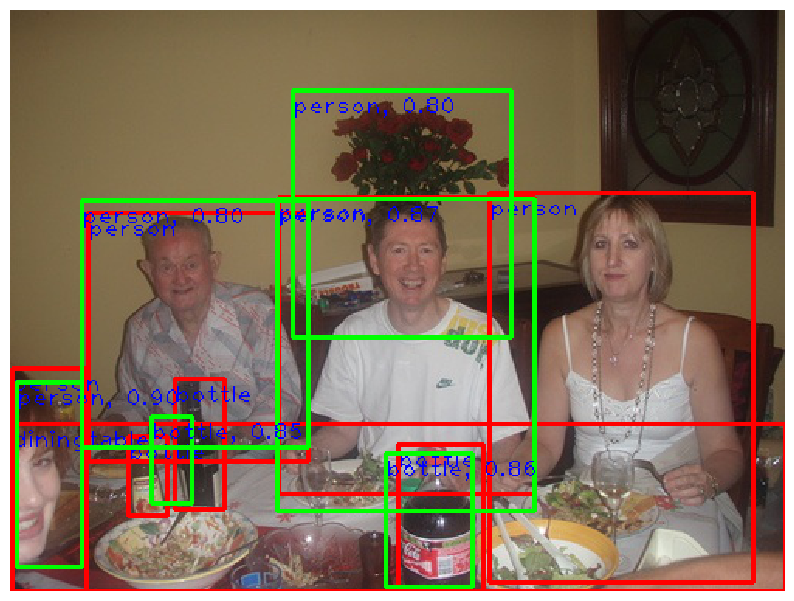

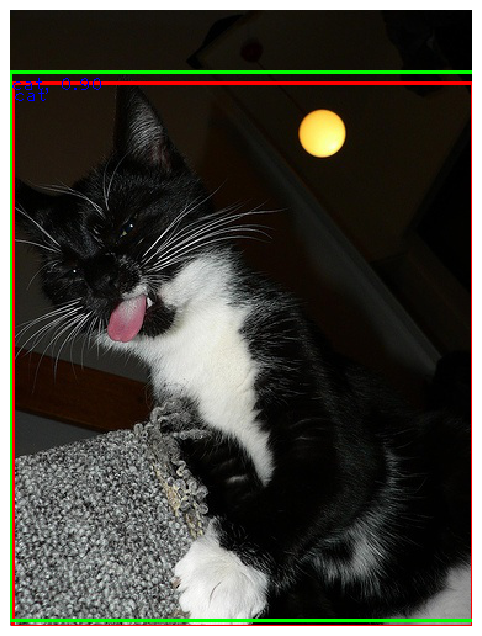

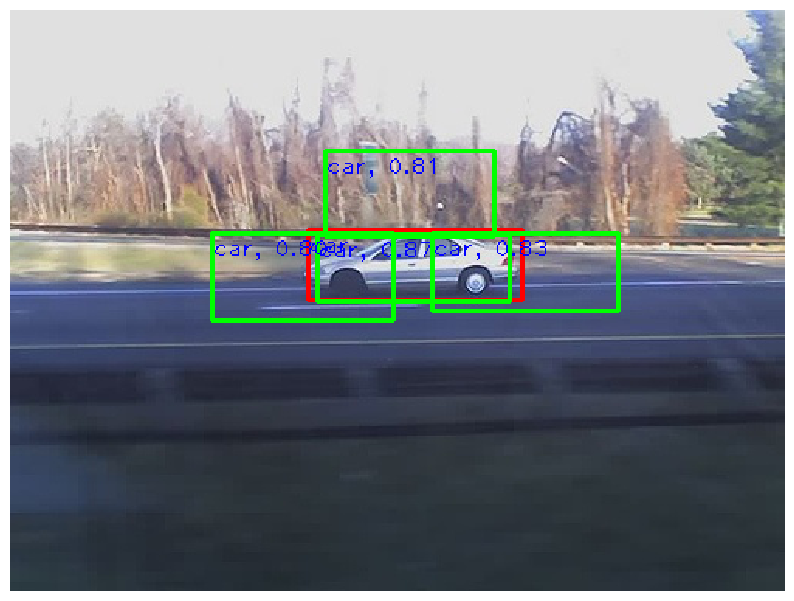

Total inference time: 0.9s


In [38]:
DetectionInference(detector, small_train_loader, small_dataset, idx_to_class, thresh=0.8, device='cuda', dtype=torch.float32)

## Inference - train a net

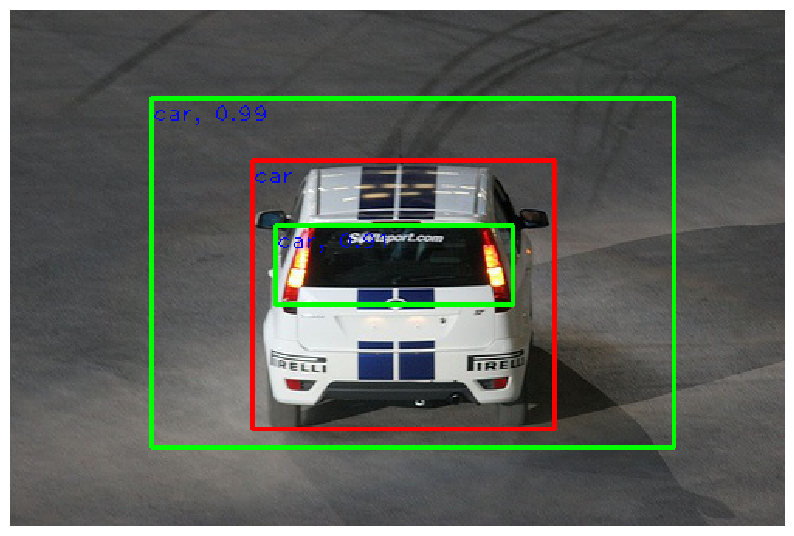

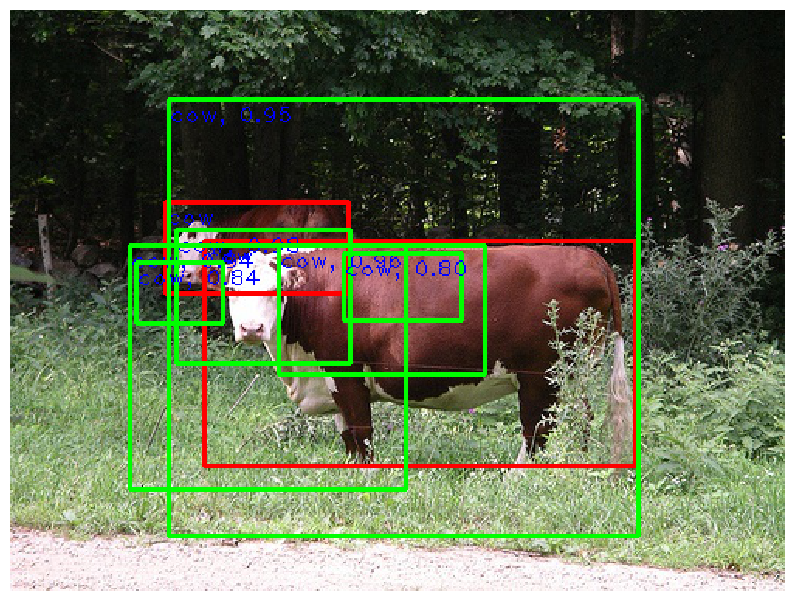

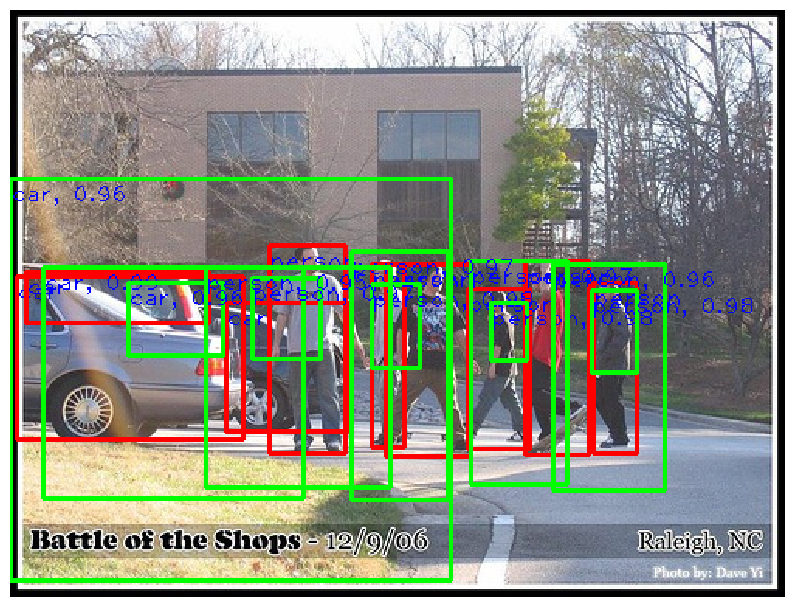

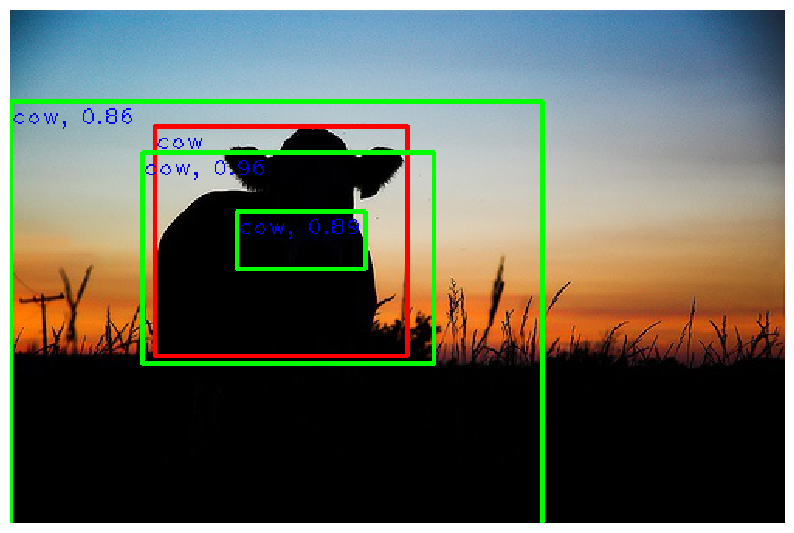

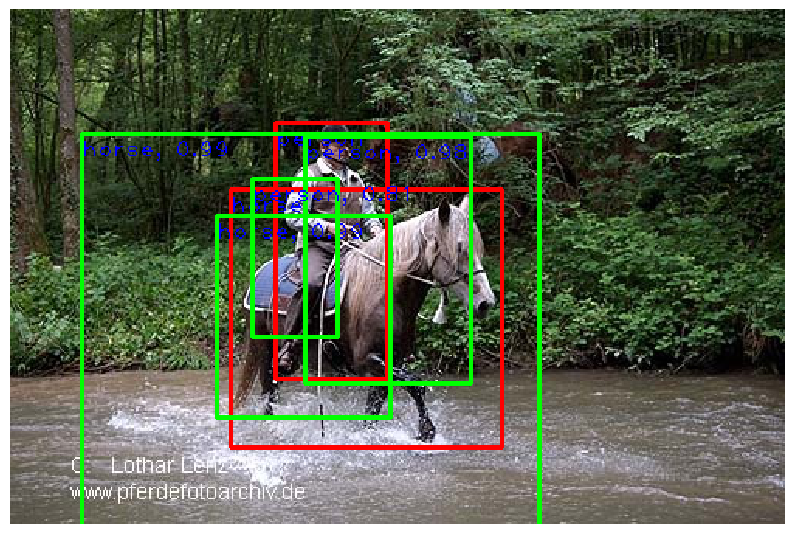

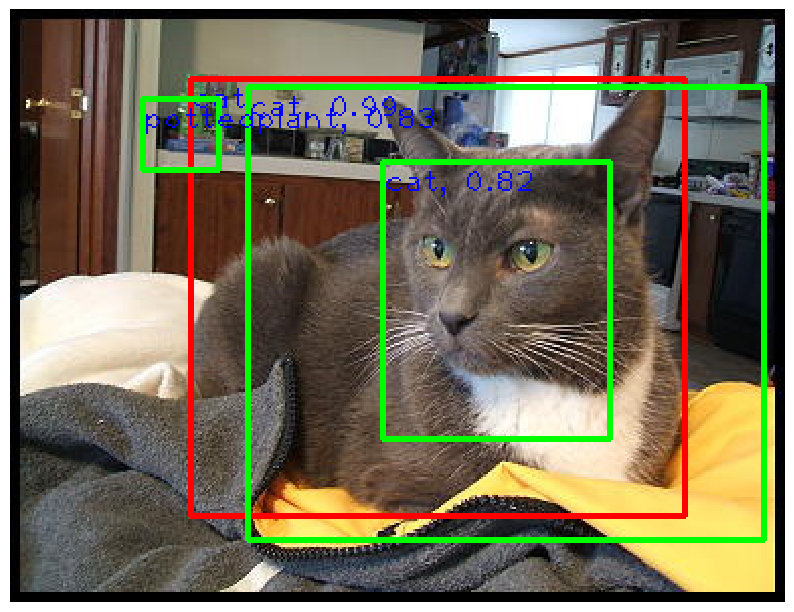

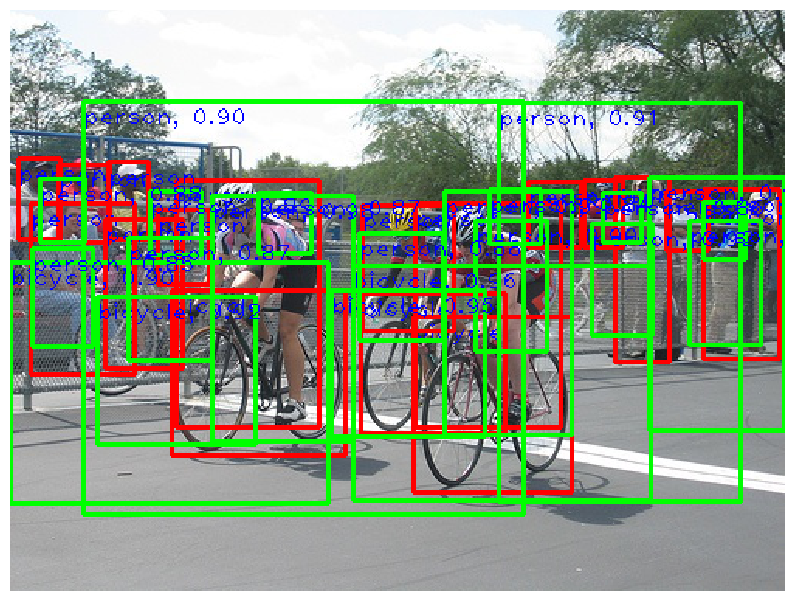

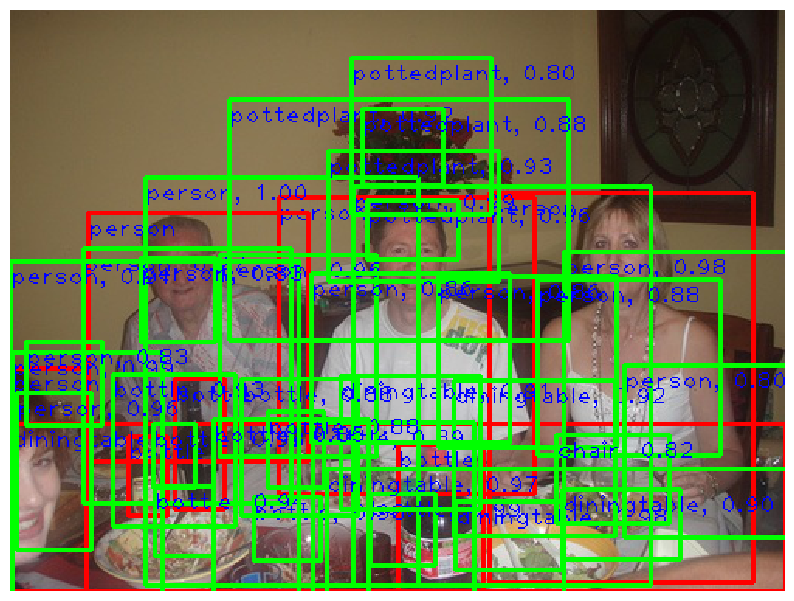

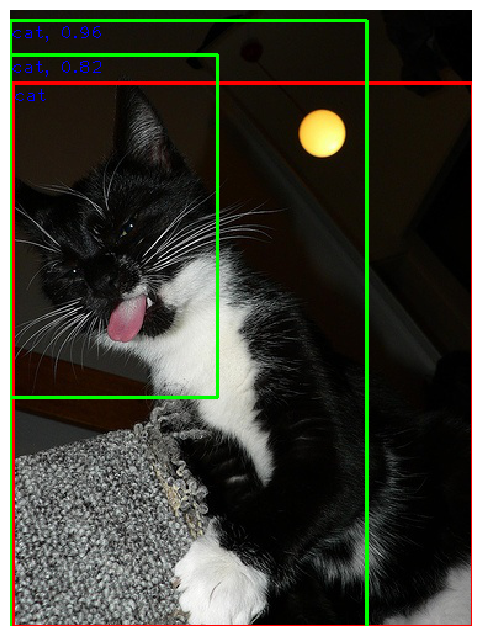

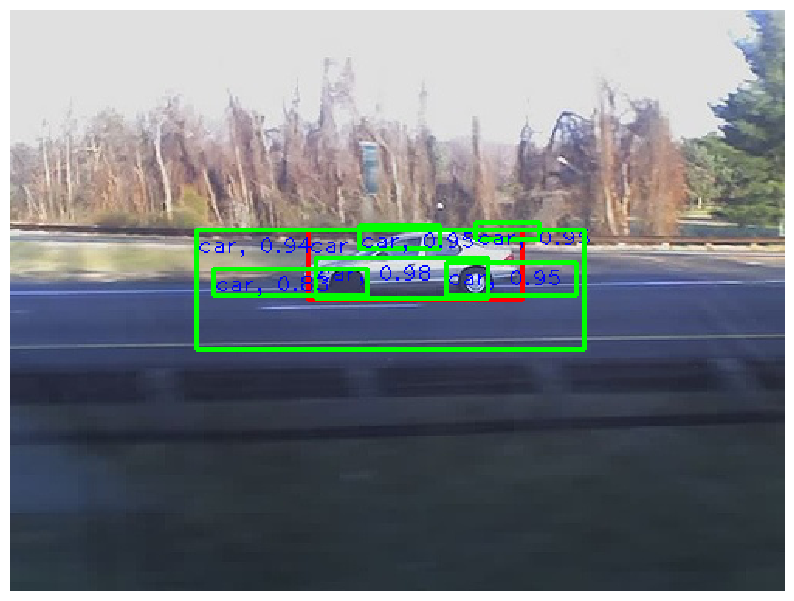

Total inference time: 0.9s


In [39]:
# visualize the same output from the model trained on the entire training set
# some bounding boxes might not make sense
DetectionInference(yolo_detector, small_train_loader, small_dataset, idx_to_class, dtype=torch.float32, device='cuda')

## Evaluation
Compute mean Average Precision (mAP)


Run the following to evaluate your detector on the PASCAL VOC validation set. You should see mAP at around 11% or above.

The state of the art on this dataset is >80% mAP! To achieve these results we would need to use a much bigger network, and train with more data and for much longer, but that is beyond the scope of this assigment.

In [44]:
DetectionInference(yolo_detector, val_loader, val_dataset, idx_to_class, output_dir='mAP/input', thresh=0.8, nms_thresh=0.3, device='cuda', dtype=torch.float32)
!cd mAP && python main.py

000005.jpg: 5 GT bboxes and 18 proposals
000007.jpg: 1 GT bboxes and 2 proposals
000009.jpg: 4 GT bboxes and 13 proposals
000016.jpg: 1 GT bboxes and 5 proposals
000019.jpg: 2 GT bboxes and 1 proposals
000020.jpg: 1 GT bboxes and 2 proposals
000021.jpg: 4 GT bboxes and 11 proposals
000024.jpg: 1 GT bboxes and 2 proposals
000030.jpg: 3 GT bboxes and 4 proposals
000039.jpg: 1 GT bboxes and 5 proposals
000041.jpg: 3 GT bboxes and 11 proposals
000046.jpg: 1 GT bboxes and 5 proposals
000050.jpg: 10 GT bboxes and 27 proposals
000051.jpg: 3 GT bboxes and 7 proposals
000052.jpg: 6 GT bboxes and 3 proposals
000060.jpg: 5 GT bboxes and 6 proposals
000063.jpg: 2 GT bboxes and 2 proposals
000065.jpg: 1 GT bboxes and 2 proposals
000072.jpg: 2 GT bboxes and 9 proposals
000081.jpg: 9 GT bboxes and 22 proposals
000093.jpg: 2 GT bboxes and 3 proposals
000095.jpg: 2 GT bboxes and 2 proposals
000099.jpg: 1 GT bboxes and 4 proposals
000101.jpg: 2 GT bboxes and 3 proposals
000102.jpg: 2 GT bboxes and 8 pro

## Try the Focal Loss in your detector

Once you have finished completing the notebook, we will add the use of Focal Loss for the computation of the classification loss. Given the limited mAP performance obtained with this limited training, we will not be able to show mPA improvement, but we can show how it can be useful when using all proposal boxes for the training of the classification task 

Perform the following tests:

*    YOLO loss without sample filtering for classification task

1.   Remove the selection of activated samples in the training classification loss (comment the corresponding code in `ObjectClassification`). Also, uncomment the code line that sums all losses in the batch.

2.   Re-run the model training and evaluate the mAP results

*    Focal Loss (also without sample filtering for classification task)

1.   Complete the implementation of the `FocalLoss` function
2.   In the `ObjectClassification` function, substitute the cross-entropy loss for the focal loss 
3.   Re-run the model training and evaluate the mAP results

Note: when you perform these changes on the notebook, the execution will not be compliant with the  sanity-checks involving loss computations

